## Data cleaning and cleansing

In [1]:
import pandas as pd
import numpy as np 

loan_csv = pd.read_csv('Lender_case_study/loan.csv')

#display the data head of 5 rows
loan_csv.head()

loan_csv.columns

#Find out how many rows are there in this data frameH
total_rows = loan_csv.shape[0]

#A list of columns which have NAs equal to 80% or above to be disregarded
columns_to_be_disregarded = []

#As we can see there are too many NAs present, whether to disregard any column or not, we will try to put a threshold
#If more than 50% of the data is NA then we can safely assume the column is not so useful here.
for column in loan_csv.columns:
    na_number_column = loan_csv[column].isna().sum()
    if na_number_column/total_rows >= 0.5:
        #print(column, loan_csv[column].isna().sum())
        columns_to_be_disregarded.append(column)

columns_to_be_disregarded 

#As the above o/p shows most of the data is not there, hence we can drop them
loan_csv_mod = loan_csv.drop(columns_to_be_disregarded, axis = 1)

#Len of the O/p of the columns which are relevant
len(loan_csv_mod.columns)

#Drop the rows which have about 50 columns empty out of 55 columns 
loan_csv_mod = loan_csv_mod.dropna(thresh=loan_csv_mod.shape[1]-49)

#As we can see from the following o/p, no row has 50 columns empty, 50 is a value which is an educated guess,out of 55
#to figure out if there are any such rows which have 50 missing values
loan_csv_mod.shape[0]

#Now we want to check which column as how many missing values are there and then we will take a call on them
print(loan_csv_mod.isna().sum())

/usr/local/Cellar/jupyterlab/3.1.14/libexec/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (47) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
term                              0
int_rate                          0
installment                       0
grade                             0
sub_grade                         0
emp_title                      2459
emp_length                     1075
home_ownership                    0
annual_inc                        0
verification_status               0
issue_d                           0
loan_status                       0
pymnt_plan                        0
url                               0
desc                          12940
purpose                           0
title                            11
zip_code                          0
addr_state                        0
dti                               0
delinq_2yrs                       0
earliest_cr_line                  0
inq_last_6mths              

### Next step: Find the outliers, then we need to either fill these values with 0 or an educated guess according to the domain, but let's clear expectations.

Reference link: https://www.kaggle.com/ekami66/detailed-exploratory-data-analysis-with-python

We can drop around 1-2% rows easily if our data is big. Don't drop rows unnecessarily, hence drop minimal rows. For the employee title use mode or put a separate category named UNKNOWN.

Univariate analysis means how much the spread is there due to impact of one continious variable on the output.

Avoid drop whenever it is asked about the outliers.

Don't include code in ppt, don't put all results in the ppt, only the sensible ones. Every graph should have x axis and y axis. Add one liner to the graph, not too much detail.

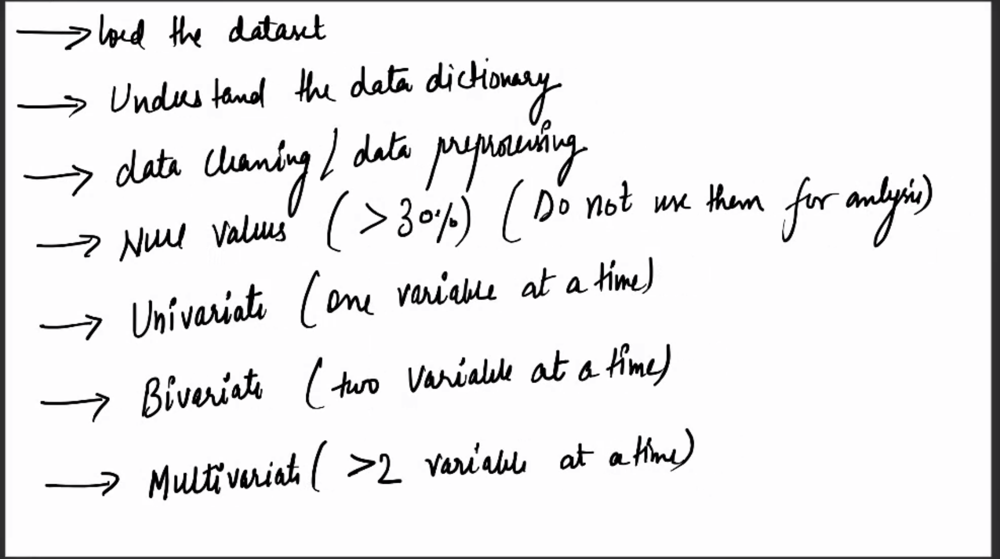

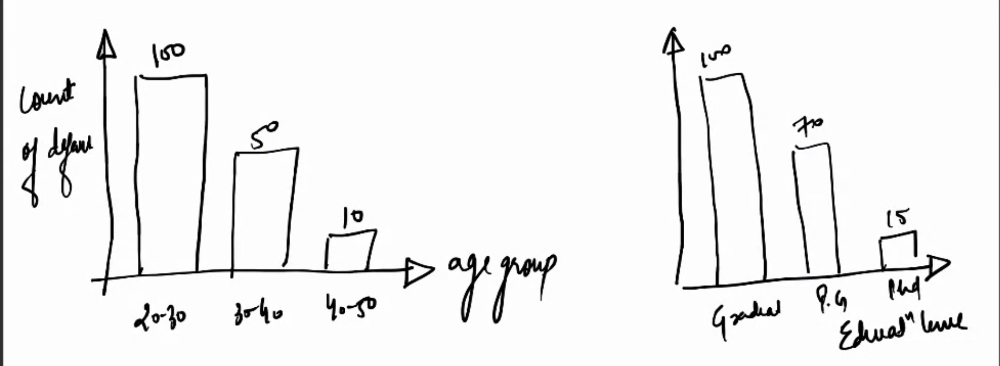
Effect of a variable on the o/p

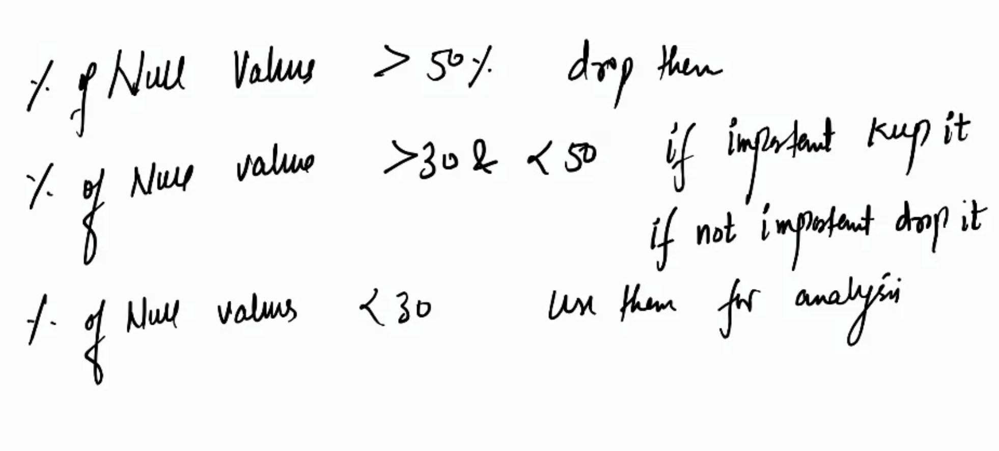

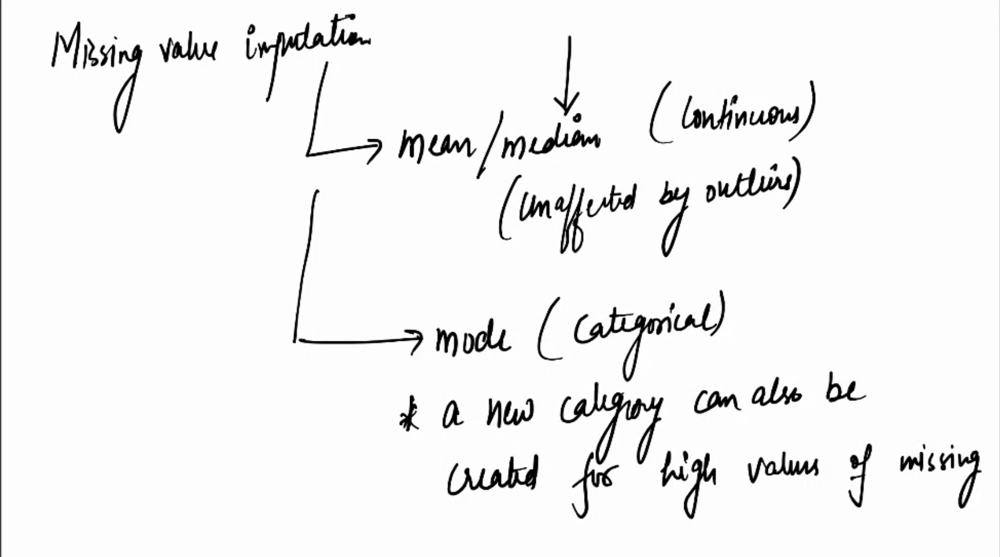

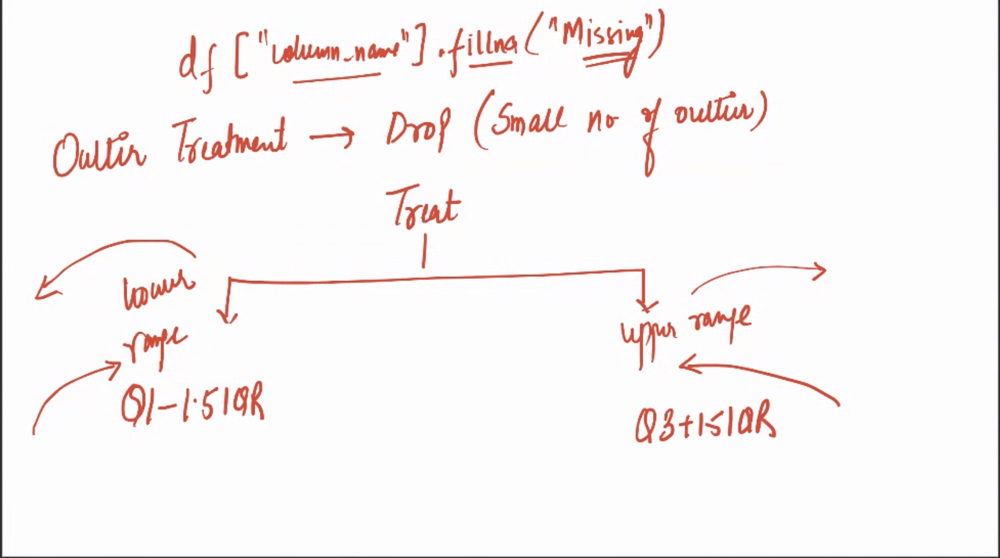
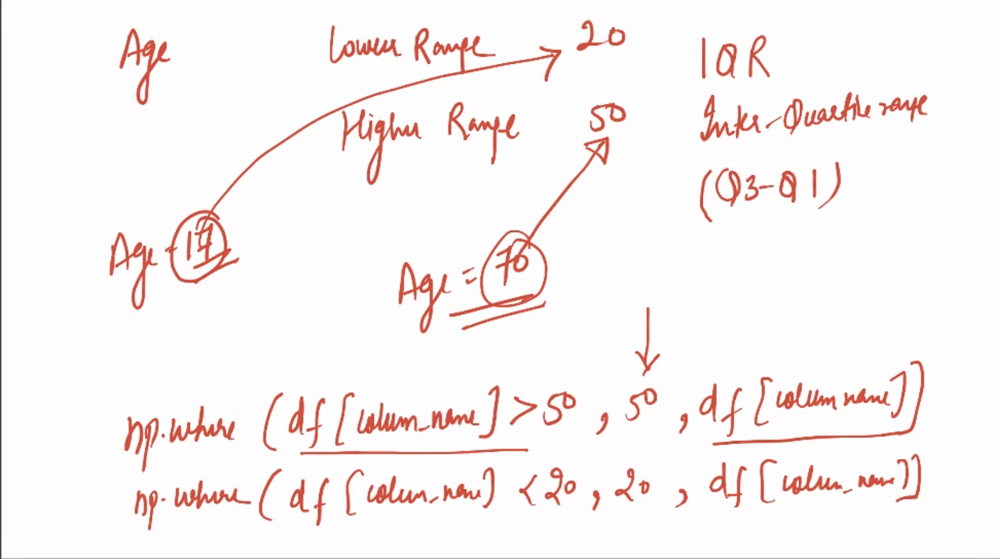

In [2]:
#Export to a file (create a base file)
loan_csv_mod.to_csv('Lender_case_study/loan_csv_mod.csv')

Find out the outliers

In [3]:
#Convert some of the object data type into int64/float64
loan_csv_mod['term'] = loan_csv_mod.term.str.split(' ').str[1]

#Convert the data type of the column from object to int64, term in months but without the string months
loan_csv_mod['term'] = loan_csv_mod['term'].astype(int)

#Check the column data type once
loan_csv_mod['term']

0        36
1        60
2        36
3        36
4        60
         ..
39712    36
39713    36
39714    36
39715    36
39716    36
Name: term, Length: 39717, dtype: int64

In [4]:
#Strip the '%' sign to make it float convertible.
loan_csv_mod['int_rate'] = loan_csv_mod.int_rate.str.strip('%')

#Convert the data type of the column from object to float64, term in months but without the string months
loan_csv_mod['int_rate'] = loan_csv_mod['int_rate'].astype(float)

#Check the column data type once
loan_csv_mod['int_rate']

0        10.65
1        15.27
2        15.96
3        13.49
4        12.69
         ...  
39712     8.07
39713    10.28
39714     8.07
39715     7.43
39716    13.75
Name: int_rate, Length: 39717, dtype: float64

In [5]:
#Strip the '%' sign to make it float convertible.
loan_csv_mod['revol_util'] = loan_csv_mod.revol_util.str.strip('%')

#Convert the data type of the column from object to float64, term in months but without the string months
loan_csv_mod['revol_util'] = loan_csv_mod['revol_util'].astype(float)

#Check the column data type once
loan_csv_mod['revol_util']

0        83.7
1         9.4
2        98.5
3        21.0
4        53.9
         ... 
39712    13.1
39713    26.9
39714    19.4
39715     0.7
39716    51.5
Name: revol_util, Length: 39717, dtype: float64

Outlier treatment guide: https://www.pluralsight.com/guides/cleaning-up-data-from-outliers

In [6]:
#Find out the data type info to figure out which all columns we are going to check for the outliers
#loan_csv_mod.info()

#List of columns which can be used for outlier detection: select a sub-dataframe with only numerical features.
list_col_outlier_test = loan_csv_mod.select_dtypes(include=['int64','float64'], exclude=[]).columns

#Drop the id and the member_id as we won't be doing any analysis on them
list_col_outlier_test[2:]

#Going to try three different ways to detect the outliers::

#1.Outliers identification through describe, check the max, min 50%
loan_csv_mod[list_col_outlier_test[2:]].describe()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,policy_code,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
count,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,39717.000000,39717.000000,39717.000000,39661.0,39717.0,39717.0,39661.0,39717.0,39020.000000,39678.0
mean,11219.443815,10947.713196,10397.448868,42.418007,12.021177,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,95.221624,12.406112,2678.826162,0.0,1.0,0.0,0.0,0.0,0.043260,0.0
std,7456.670694,7187.238670,7128.450439,10.622815,3.724825,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,688.744771,148.671593,4447.136012,0.0,0.0,0.0,0.0,0.0,0.204324,0.0
min,500.000000,500.000000,0.000000,36.000000,5.420000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,1.0,0.0,0.0,0.0,0.000000,0.0
25%,5500.000000,5400.000000,5000.000000,36.000000,9.250000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,0.000000,0.000000,218.680000,0.0,1.0,0.0,0.0,0.0,0.000000,0.0
50%,10000.000000,9600.000000,8975.000000,36.000000,11.860000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,0.000000,0.000000,546.140000,0.0,1.0,0.0,0.0,0.0,0.000000,0.0
75%,15000.000000,15000.000000,14400.000000,60.000000,14.590000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,0.000000,0.000000,3293.160000,0.0,1.0,0.0,0.0,0.0,0.000000,0.0
max,35000.000000,35000.000000,35000.000000,60.000000,24.590000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,29623.350000,7002.190000,36115.200000,0.0,1.0,0.0,0.0,0.0,2.000000,0.0


In [7]:
#2.Through IQR

#Or we can directy find the quantile on a numeric only
#Which means only taking int and float into consideration, no object or datetime
Q1 = loan_csv_mod.quantile(0.25, numeric_only=True)
Q3 = loan_csv_mod.quantile(0.75, numeric_only=True) 
IQR = Q3 - Q1

#Fence_low and fence_high
fence_low  = Q1 - 1.5 * IQR
fence_high = Q3 + 1.5 * IQR

#print(Q1,Q3,fence_low,fence_high)

#Find out the cells which above or below the fence boundaries
series_dummy = ((loan_csv_mod < fence_low) | (loan_csv_mod > fence_high)).sum()

series_dummy[series_dummy>0]

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/35317780.py:16: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  series_dummy = ((loan_csv_mod < fence_low) | (loan_csv_mod > fence_high)).sum()


annual_inc                 1843
collection_recovery_fee    3782
delinq_2yrs                4312
funded_amnt                1038
funded_amnt_inv            1000
inq_last_6mths             3634
installment                1245
int_rate                     78
last_pymnt_amnt            4286
loan_amnt                  1230
member_id                    26
open_acc                    515
out_prncp                  1140
out_prncp_inv              1140
pub_rec                    2116
pub_rec_bankruptcies       1681
recoveries                 4218
revol_bal                  2497
total_acc                   525
total_pymnt                1334
total_pymnt_inv            1441
total_rec_int              3157
total_rec_late_fee         2046
total_rec_prncp             972
dtype: int64

In [8]:
#Through Skewness, the 0s will be 

#Ideally, the skewness value should be between -1 and +1, 
#Any major deviation from this range indicates the presence of extreme values.
skew_series = loan_csv_mod[list_col_outlier_test[2:]].skew()

# Get rid of values inside a range for a defined column, as we see there is no negetive skewness we can observe
#Giving an interval of -1.5 to 1.5 gives use fewer columns which can be normalized
filtered_skew_series = skew_series[~skew_series.between(-1.5,1.5)]

#Change series to a dataframe
skew_df = pd.DataFrame({'skew_col':filtered_skew_series.index, 'skewness':filtered_skew_series.values})

skew_df

,skew_col,skewness
0,annual_inc,30.949185
1,delinq_2yrs,5.022035
2,pub_rec,4.538051
3,revol_bal,3.190884
4,out_prncp,9.226730
5,out_prncp_inv,9.243765
6,total_rec_int,2.668747
7,total_rec_late_fee,8.429536
8,recoveries,16.519378
9,collection_recovery_fee,25.029418


In [9]:
#Basically through all of them we can choose one, I choose the skewness, less number of columns to be normalized
#Also the skewness set is a subset of the IQR technique which validates.
#All of the output is going to floored, not much we can see which can be capped.

#Rather than getting a manual list, we change series to dataframe and a column of df to a series
skew_col_list = ['annual_inc','delinq_2yrs','pub_rec','revol_bal','out_prncp','out_prncp_inv','total_rec_int','total_rec_late_fee','recoveries','collection_recovery_fee','last_pymnt_amnt','pub_rec_bankruptcies']

#a column of df to a series
skew_col_list = skew_df['skew_col']

skew_col_list

print(loan_csv_mod[skew_col_list].quantile(0.90))

#Try normalizing each of the skewed column, we will cap it as we have more positive skewness
for col in skew_col_list:
    max_normalize = loan_csv_mod[col].quantile(0.90)
    loan_csv_mod[col] = np.where(loan_csv_mod[col] > max_normalize, max_normalize,loan_csv_mod[col])
    print(loan_csv_mod[col].skew())


annual_inc                 116000.000
delinq_2yrs                     1.000
pub_rec                         0.000
revol_bal                   29144.400
out_prncp                       0.000
out_prncp_inv                   0.000
total_rec_int                5336.246
total_rec_late_fee              0.000
recoveries                     13.598
collection_recovery_fee         0.000
last_pymnt_amnt              8312.710
pub_rec_bankruptcies            0.000
Name: 0.9, dtype: float64
0.44220410997455656
2.5165603745484337
0
0.7095119204849574
0
0
0.9389474283936368
0
2.5669993622391254
0
1.2923658124856994
0


In [10]:
#The end skewness is almost balanced, although some are out of our range but those are not too far
loan_csv_mod[list_col_outlier_test[2:]].skew()

loan_amnt                     1.059317
funded_amnt                   1.081710
funded_amnt_inv               1.106213
term                          1.050997
int_rate                      0.293729
installment                   1.128419
annual_inc                    0.442204
dti                          -0.028043
delinq_2yrs                   2.516560
inq_last_6mths                1.390391
open_acc                      1.003762
pub_rec                       0.000000
revol_bal                     0.709512
revol_util                   -0.033579
total_acc                     0.827379
out_prncp                     0.000000
out_prncp_inv                 0.000000
total_pymnt                   1.339857
total_pymnt_inv               1.354838
total_rec_prncp               1.118255
total_rec_int                 0.938947
total_rec_late_fee            0.000000
recoveries                    2.566999
collection_recovery_fee       0.000000
last_pymnt_amnt               1.292366
collections_12_mths_ex_me

Now we will try to go for imputation.

In [11]:
#Now we want to check which column as how many missing values are there and then we will take a call on them
print(loan_csv_mod.isna().sum())

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
term                              0
int_rate                          0
installment                       0
grade                             0
sub_grade                         0
emp_title                      2459
emp_length                     1075
home_ownership                    0
annual_inc                        0
verification_status               0
issue_d                           0
loan_status                       0
pymnt_plan                        0
url                               0
desc                          12940
purpose                           0
title                            11
zip_code                          0
addr_state                        0
dti                               0
delinq_2yrs                       0
earliest_cr_line                  0
inq_last_6mths              

In [12]:
#Some issues when trying to fillNa object type in the csv, hence converting it into string
#loan_csv_mod['last_credit_pull_d'] = loan_csv_mod['last_credit_pull_d'].astype('str')
#loan_csv_mod['last_pymnt_d'] = loan_csv_mod['last_pymnt_d'].astype('str')
#loan_csv_mod['title'] = loan_csv_mod['title'].astype('str')
#loan_csv_mod['desc'] = loan_csv_mod['desc'].astype('str')
#loan_csv_mod['emp_length'] = loan_csv_mod['emp_length'].astype('str')
#loan_csv_mod['emp_title'] = loan_csv_mod['emp_title'].astype('str')

##No need of conversions

In [13]:
#Find mean/median on continious variables, continious variables
loan_csv_mod['tax_liens'] = loan_csv_mod['tax_liens'].fillna(loan_csv_mod['tax_liens'].median())
loan_csv_mod['pub_rec_bankruptcies'] = loan_csv_mod['pub_rec_bankruptcies'].fillna(loan_csv_mod['pub_rec_bankruptcies'].median())
loan_csv_mod['chargeoff_within_12_mths'] = loan_csv_mod['chargeoff_within_12_mths'].fillna(loan_csv_mod['chargeoff_within_12_mths'].median())
loan_csv_mod['collections_12_mths_ex_med'] = loan_csv_mod['collections_12_mths_ex_med'].fillna(loan_csv_mod['collections_12_mths_ex_med'].median())
loan_csv_mod['revol_util'] = loan_csv_mod['revol_util'].fillna(loan_csv_mod['revol_util'].median())

#For categorical data the mode is not working like above
#Not working
#loan_csv_mod['last_credit_pull_d'] = loan_csv_mod['last_credit_pull_d'].fillna(loan_csv_mod['last_credit_pull_d'].mode())
#Not working
#loan_csv_mod['last_pymnt_d'] = loan_csv_mod['last_pymnt_d'].fillna(loan_csv_mod['last_pymnt_d'].mode())
#Not working
#loan_csv_mod['title'] = loan_csv_mod['title'].fillna(loan_csv_mod['title'].mode())
#Not working
#loan_csv_mod['emp_length'] = loan_csv_mod['emp_length'].fillna(loan_csv_mod['emp_length'].mode())

#Because 
#Replace with mere strings only works fine
loan_csv_mod['desc'] = loan_csv_mod['desc'].fillna('Not Known')
loan_csv_mod['emp_title'] = loan_csv_mod['emp_title'].fillna('UNKWN')

#correct way to do
loan_csv_mod['last_credit_pull_d'] = loan_csv_mod['last_credit_pull_d'].fillna(loan_csv_mod['last_credit_pull_d'].mode()[0])

loan_csv_mod['last_pymnt_d'] = loan_csv_mod['last_pymnt_d'].fillna(loan_csv_mod['last_pymnt_d'].mode()[0])

loan_csv_mod['title'] = loan_csv_mod['title'].fillna(loan_csv_mod['title'].mode()[0])

loan_csv_mod['emp_length'] = loan_csv_mod['emp_length'].fillna(loan_csv_mod['emp_length'].mode()[0])



print(loan_csv_mod.isna().sum())


id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                     0
emp_length                    0
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
url                           0
desc                          0
purpose                       0
title                         0
zip_code                      0
addr_state                    0
dti                           0
delinq_2yrs                   0
earliest_cr_line              0
inq_last_6mths                0
open_acc                      0
pub_rec                       0
revol_bal                     0
revol_ut

In [14]:
import re
from datetime import datetime

#Extract date from the description and create a derived metric column
def checking_valid_dates(desc):
    if desc:
        match_str = re.search(r'\d{2}/\d{2}/\d{2}', desc)
        if match_str is not None:
            #print(match_str.group()) string from the re match type
            res = datetime.strptime(match_str.group(), '%m/%d/%y').date()
            #print(res) to print out the date
            return res

#Use lambda to create a separate column
loan_csv_mod['approved_date'] = loan_csv_mod['desc'].apply(lambda desc: checking_valid_dates(desc))

#View the data
loan_csv_mod['approved_date']

#Have taken median approval date
median_approval_date = loan_csv_mod['approved_date'].astype('datetime64[ns]').quantile(0.5, interpolation="midpoint")


loan_csv_mod['approved_date'] = loan_csv_mod['approved_date'].fillna(median_approval_date)

#Extract date out of date and time
loan_csv_mod['approved_date'] = pd.to_datetime(loan_csv_mod['approved_date']).dt.date

/usr/local/lib/python3.9/site-packages/pandas/core/indexes/base.py:2023: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  return self._engine.is_unique
/usr/local/lib/python3.9/site-packages/pandas/core/indexes/base.py:3512: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  indexer = self._engine.get_indexer(target._get_engine_target())


In [15]:
#Make sure there are no missing values, all imputation complete
print(loan_csv_mod.isna().sum())

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_title                     0
emp_length                    0
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
url                           0
desc                          0
purpose                       0
title                         0
zip_code                      0
addr_state                    0
dti                           0
delinq_2yrs                   0
earliest_cr_line              0
inq_last_6mths                0
open_acc                      0
pub_rec                       0
revol_bal                     0
revol_ut

In [16]:
loan_csv_mod['year'] = pd.DatetimeIndex(loan_csv_mod['approved_date']).year
loan_csv_mod['month'] = pd.DatetimeIndex(loan_csv_mod['approved_date']).month_name()

In [17]:
#Export to a file
loan_csv_mod.to_csv('Lender_case_study/loan_csv_mod.csv')

In [18]:
loan_csv_mod.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39717 entries, 0 to 39716
Data columns (total 57 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39717 non-null  int64  
 1   member_id                   39717 non-null  int64  
 2   loan_amnt                   39717 non-null  int64  
 3   funded_amnt                 39717 non-null  int64  
 4   funded_amnt_inv             39717 non-null  float64
 5   term                        39717 non-null  int64  
 6   int_rate                    39717 non-null  float64
 7   installment                 39717 non-null  float64
 8   grade                       39717 non-null  object 
 9   sub_grade                   39717 non-null  object 
 10  emp_title                   39717 non-null  object 
 11  emp_length                  39717 non-null  object 
 12  home_ownership              39717 non-null  object 
 13  annual_inc                  397

In [19]:
#Categorical variables
categorical_list = loan_csv_mod.select_dtypes(include=['object'], exclude=[]).columns.tolist()

categorical_list.remove('loan_status')
categorical_list.remove('emp_title')
categorical_list.remove('url')
categorical_list.remove('desc')
categorical_list.remove('issue_d')
categorical_list.remove('pymnt_plan')
categorical_list.remove('zip_code')
categorical_list.remove('initial_list_status')
categorical_list.remove('approved_date')

#categorical data which makes sense to us in the dataframe
categorical_list

['grade',
 'sub_grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'purpose',
 'title',
 'addr_state',
 'earliest_cr_line',
 'last_pymnt_d',
 'last_credit_pull_d',
 'application_type',
 'month']

In [20]:
#Continious variables
continious_list = loan_csv_mod.select_dtypes(include=['int64','float64'], exclude=[]).columns.tolist()

continious_list.remove('id')
continious_list.remove('member_id')
continious_list.remove( 'pub_rec')
continious_list.remove('out_prncp')
continious_list.remove('total_rec_late_fee')
continious_list.remove('recoveries')
continious_list.remove('collection_recovery_fee')
continious_list.remove('collections_12_mths_ex_med')
continious_list.remove('policy_code')
continious_list.remove('acc_now_delinq')
continious_list.remove('chargeoff_within_12_mths')
continious_list.remove('delinq_amnt')
continious_list.remove('pub_rec_bankruptcies')
continious_list.remove('tax_liens')


continious_list

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'term',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'open_acc',
 'revol_bal',
 'revol_util',
 'total_acc',
 'out_prncp_inv',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'last_pymnt_amnt',
 'year']

In [21]:
#To plot the loan_status as a continious on the y axis, we need to make it continious
df = loan_csv_mod

# filtering only fully paid/charged-off/current
#df = df[df['loan_status'] != 'Current']
#df['loan_status'] = df['loan_status'].apply(lambda x: 0 if x=='Fully Paid' else (2 if x=='Current' else 1))

df = df[df['loan_status'] != 'Current']
df['loan_status'] = df['loan_status'].apply(lambda x: 0 if x=='Fully Paid' else 1)

# converting loan_status to integer type
df['loan_status'] = df['loan_status'].apply(lambda x: pd.to_numeric(x))

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/1458631630.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['loan_status'] = df['loan_status'].apply(lambda x: 0 if x=='Fully Paid' else 1)
/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/1458631630.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['loan_status'] = df['loan_status'].apply(lambda x: pd.to_numeric(x))


In [22]:
# summarising the values
loan_status_numeric = df['loan_status'].value_counts()

In [23]:
#Manual way of calculating the default_rate
type(loan_status_numeric)

loan_status_numeric[1]

default_rate = round(loan_status_numeric[1]/df.shape[0],2)

In [24]:
# default rate with respect to the closed loans
round(np.mean(df['loan_status']), 2)

0.15

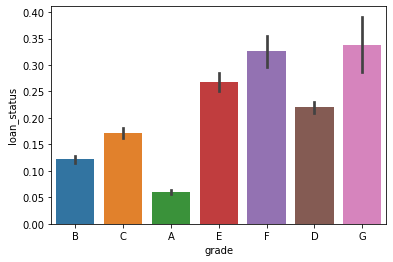

In [25]:
import matplotlib.pyplot as plt
import matplotlib.pylab as plab
import seaborn as sns
from statsmodels.graphics.mosaicplot import mosaic

# plotting default rates across grade of the loan
sns.barplot(x='grade', y='loan_status', data=df)

plt.show()

In [26]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 30

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
plt.rcParams['figure.figsize'] = [30, 15] #Adjust the size of the plot

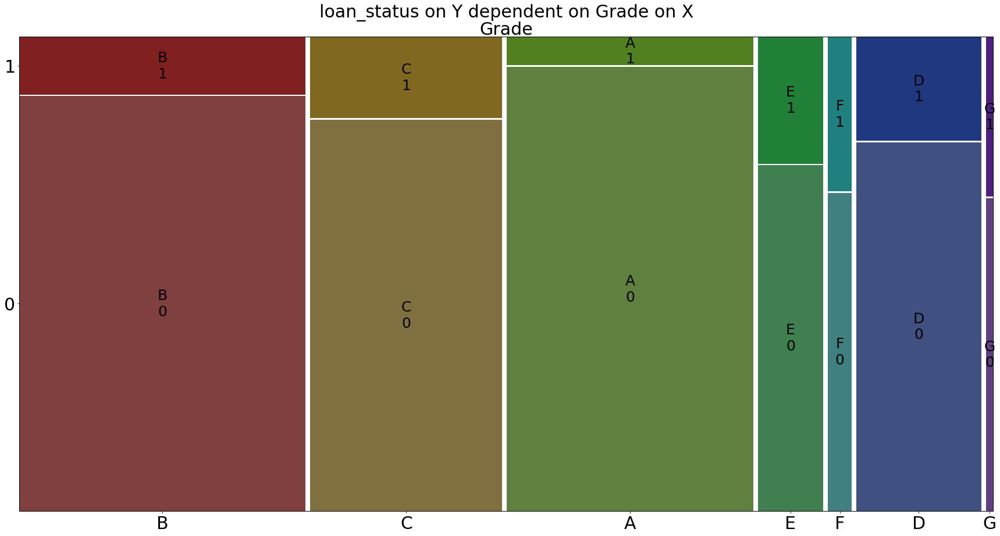

In [27]:
#Clearly, as the grade of loan goes from A to G, the default rate increases. 
#Better grades can mean better way of repaying the loan, bad grades result in defaults
#Low grade is one driving factor

'''
Why Mosaic plot?

* A mosaic plot is a special type of stacked bar chart. 
* For two variables, the width of the columns is proportional to the number of observations 
in each level of the variable plotted on the horizontal axis. 
* The vertical length of the bars 
is proportional to the number of observations in the second variable within each level of the first variable.

Reference: https://www.jmp.com/en_us/statistics-knowledge-portal/exploratory-data-analysis/mosaic-plot.html
'''

mosaic(data=df, index=['grade', 'loan_status'])
plt.title('loan_status on Y dependent on Grade on X')
plt.ylabel('loan_status')
plt.xlabel('Grade')
plt.show()

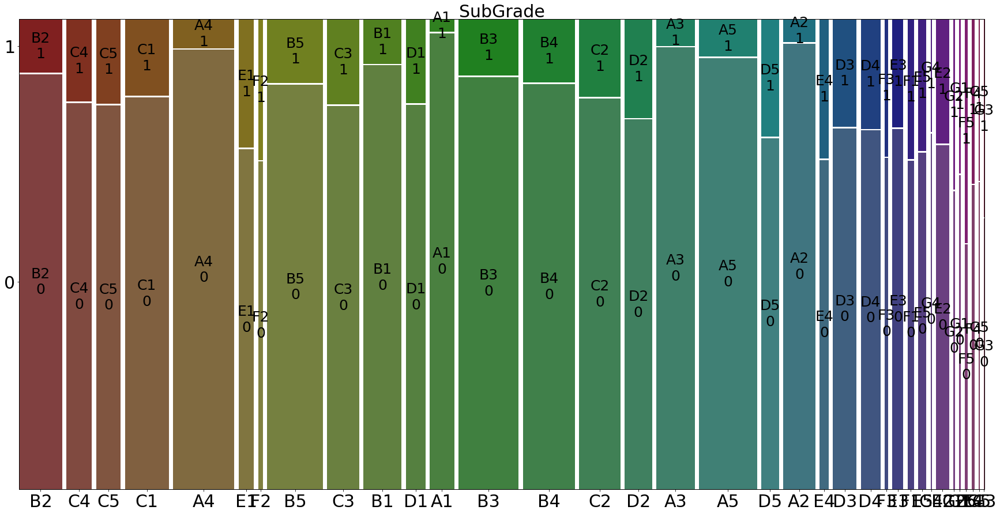

In [28]:
#Even subgrade are justifying the grade vs loan_status hypothesis we had and then we can have a correlation between
#subgrades and grades
mosaic(data=df, index=['sub_grade', 'loan_status'])
plt.ylabel("Loan_status")
plt.xlabel("SubGrade")
plt.show()

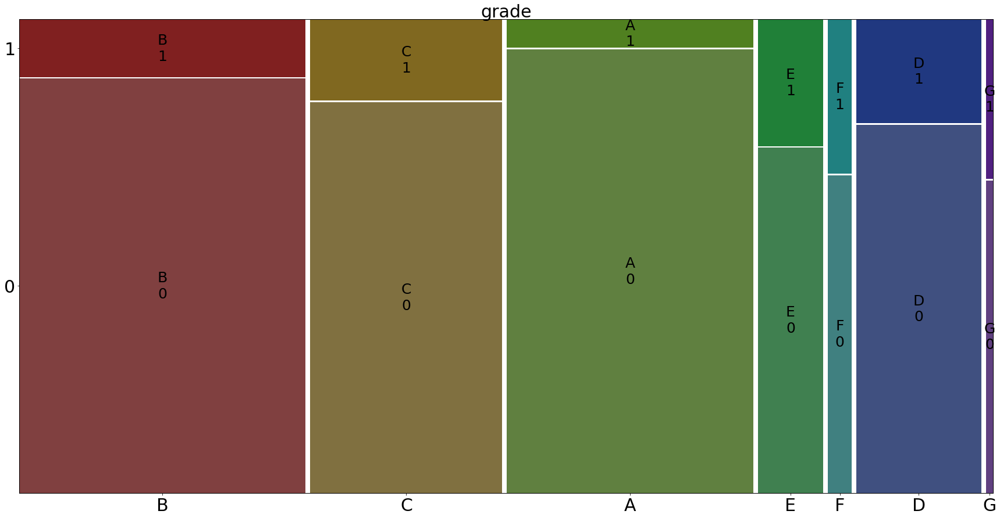

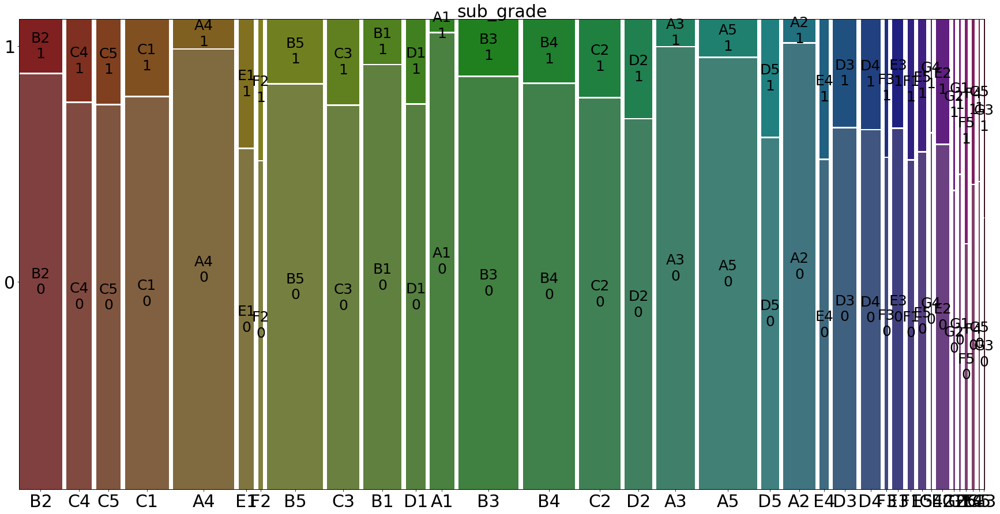

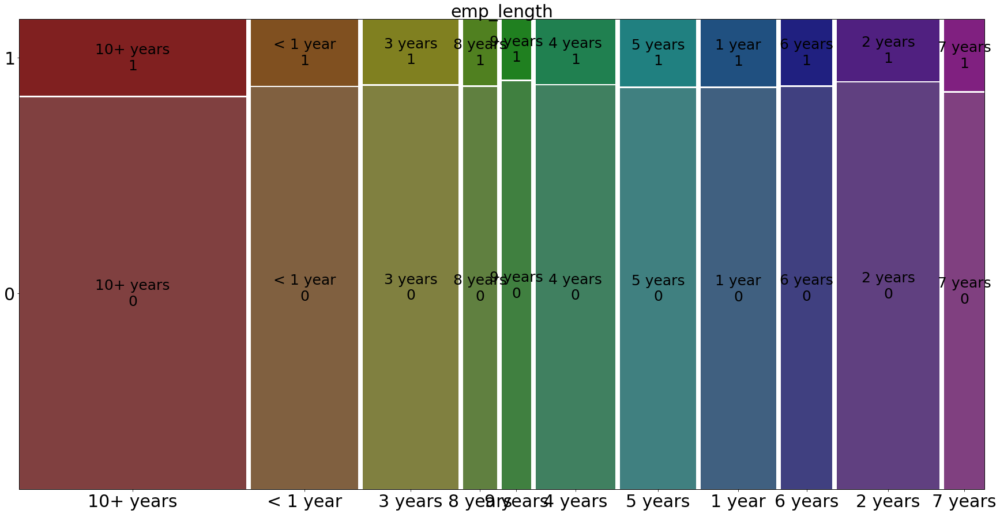

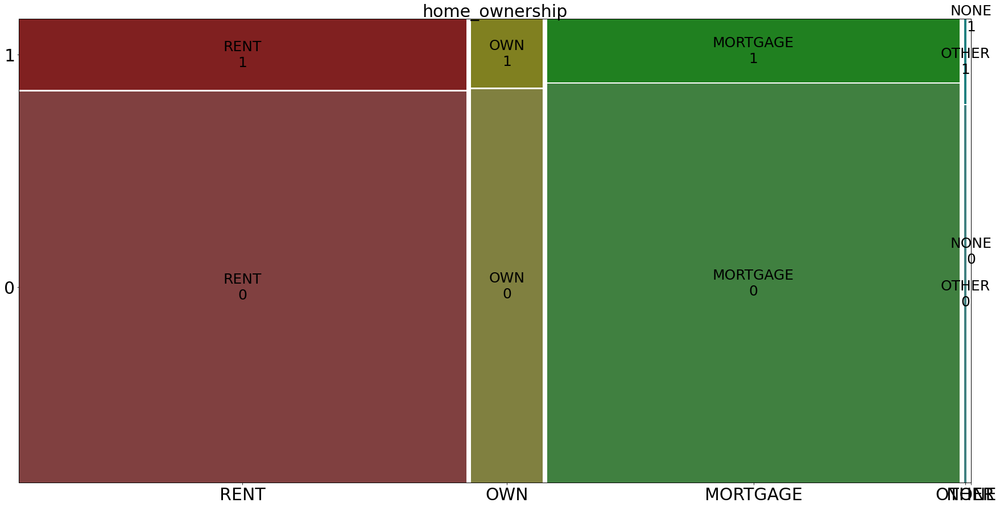

In [29]:
for col in categorical_list[0:4]:
    mosaic(data=df, index=[col, 'loan_status'])
    plt.ylabel("Loan_status")
    plt.xlabel(col)
    plt.show()

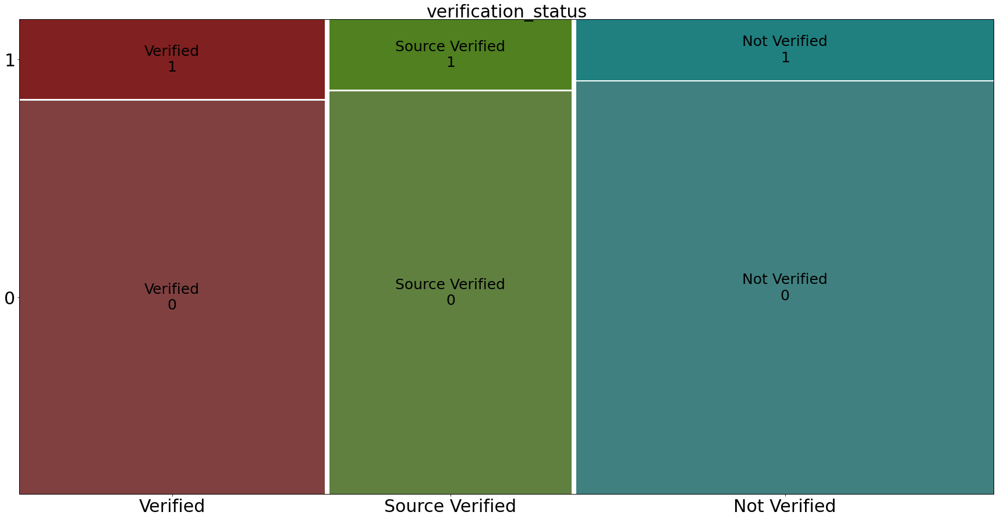

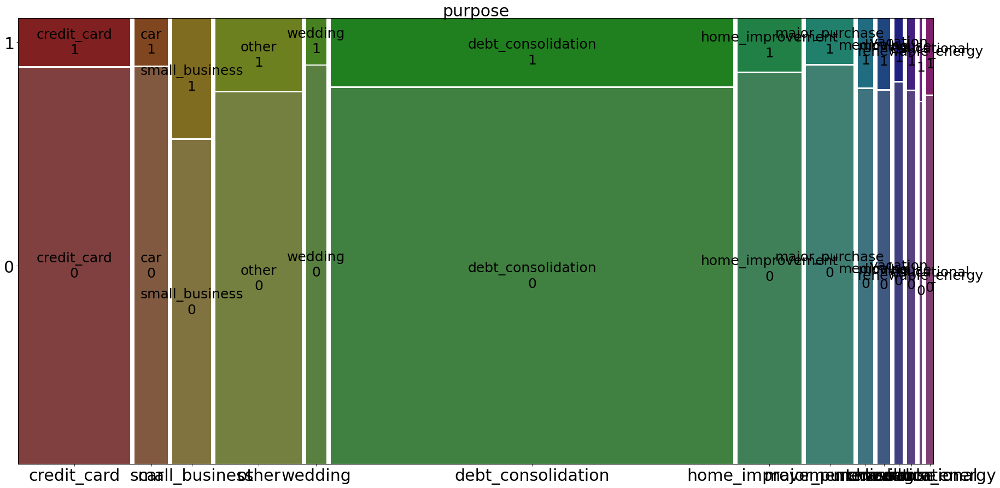

/usr/local/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 150 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 130 missing from current font.
  font.set_text(s, 0.0, flags=flags)


ValueError: 
$$
^
Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 2160x1080 with 3 Axes>

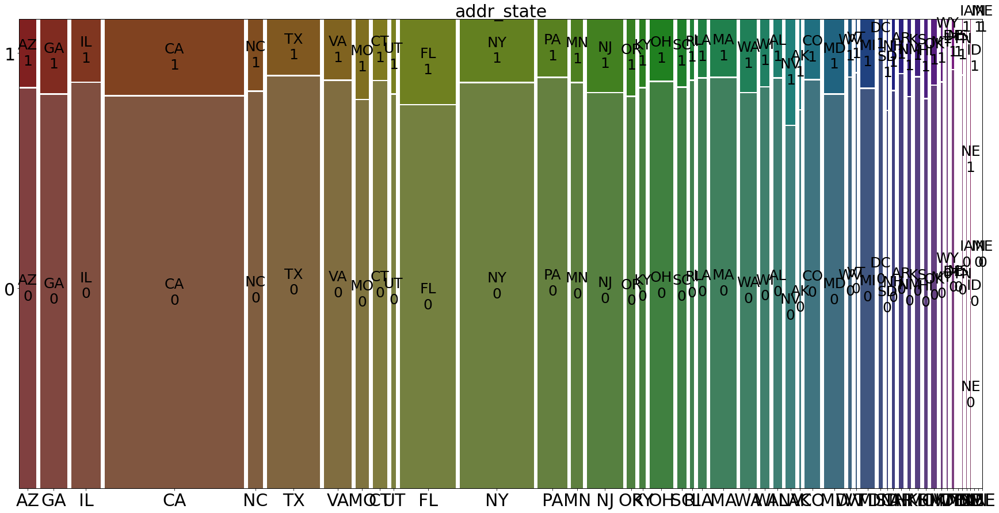

In [30]:
for col in categorical_list[4:8]:
    mosaic(data=df, index=[col, 'loan_status'])
    plt.ylabel("Loan_status")
    plt.xlabel(col)
    plt.show()
    
#Verified guy is defaulting, not verified guy is paying off the loan, it can be taken as a factor that our
#Bank Verification has a flaw.

#Can't really say what to make out of issue date-> Inconclusive
#Paymnt plan -> Inconclusive most are n
#Purpose -> 

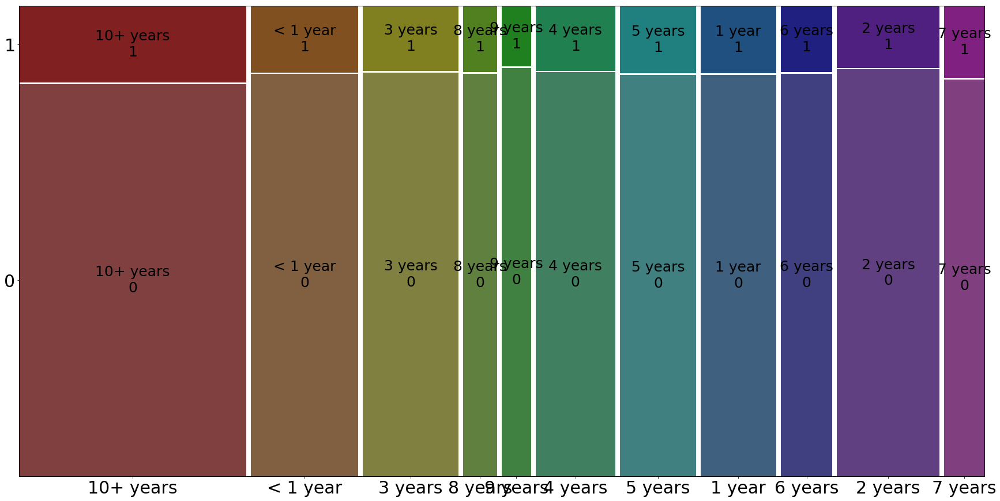

In [31]:
#No colclusion can be drawn as 7 years also is very equal to 10+ and 3 years is very close to 8 years
mosaic(data=df, index=['emp_length', 'loan_status'])
plt.show()
#Inconclusive, can't say growing experience is very decidable to the pay off or default.

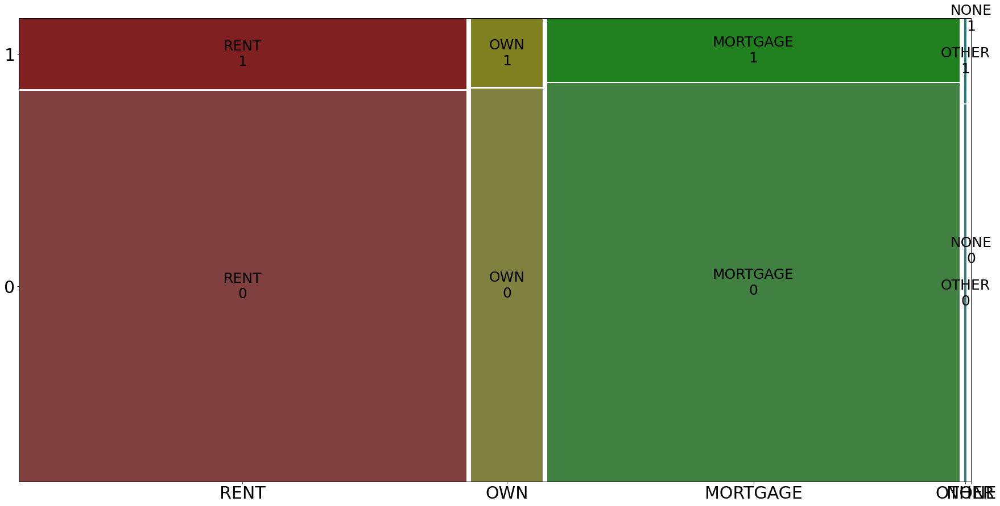

In [32]:
mosaic(data=df, index=['home_ownership', 'loan_status'])
plt.show()
# Those who have mortgage are less default, Other is more default
# Mortgage -> Own -> Rent -> Other
# Those whose home_ownership on rent or other are likely to default. Rent is our second driving factor.

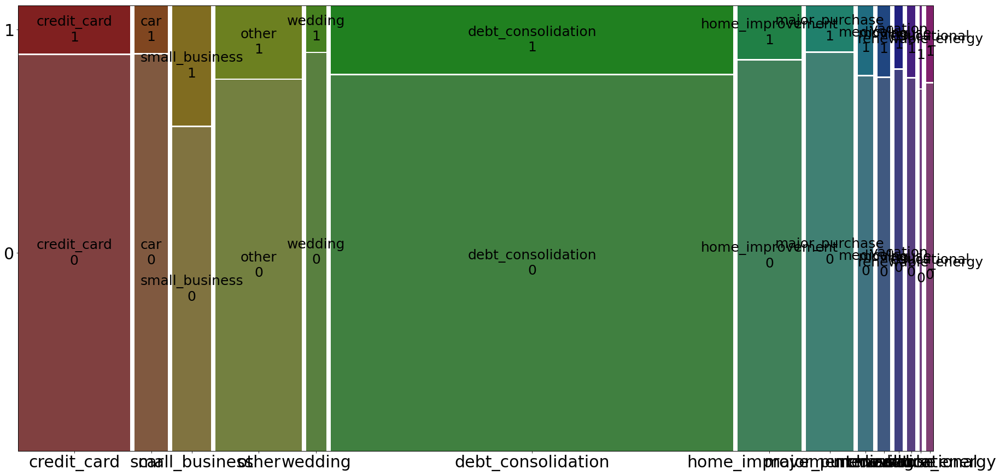

In [33]:
mosaic(data=df, index=['purpose', 'loan_status'])
plt.show()

#Small business loans tends to default much more, hence any loan going to small business can lead to default
#While major purpose, credit_card, car wedding and home_imprvement are safe bets.
#All other defaulting categories, the population is pretty less to conclude anything at all.

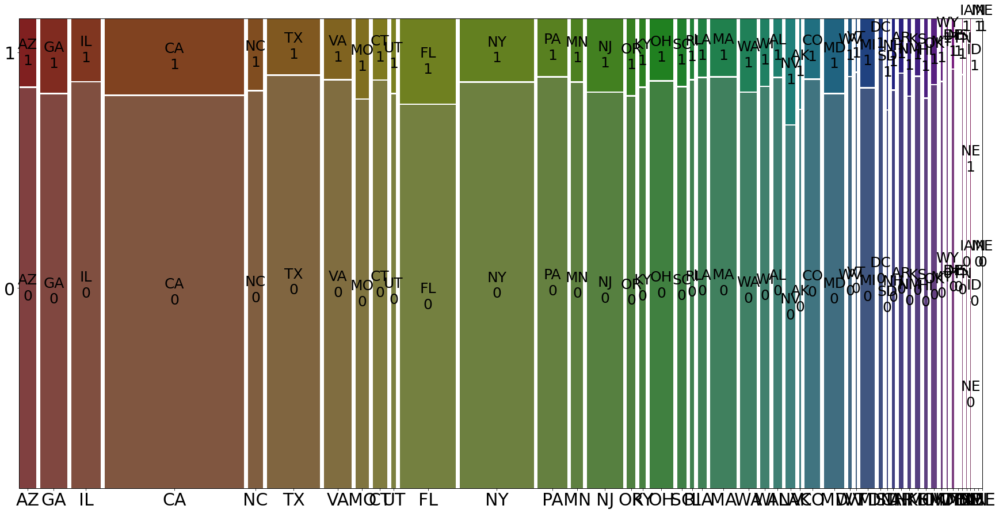

In [34]:
mosaic(data=df, index=['addr_state', 'loan_status'])
plt.show()

#Observations:
#Let's focus on two states which have the highest population FL and CA, if we talk about the low population, 
#NV state defaults the most(less population), 
#FL has defaults most in standard population
#most loans go to CA 
#Texas & NY has the least default
#PA does the best.
#Unordered categorical data: Segmented 

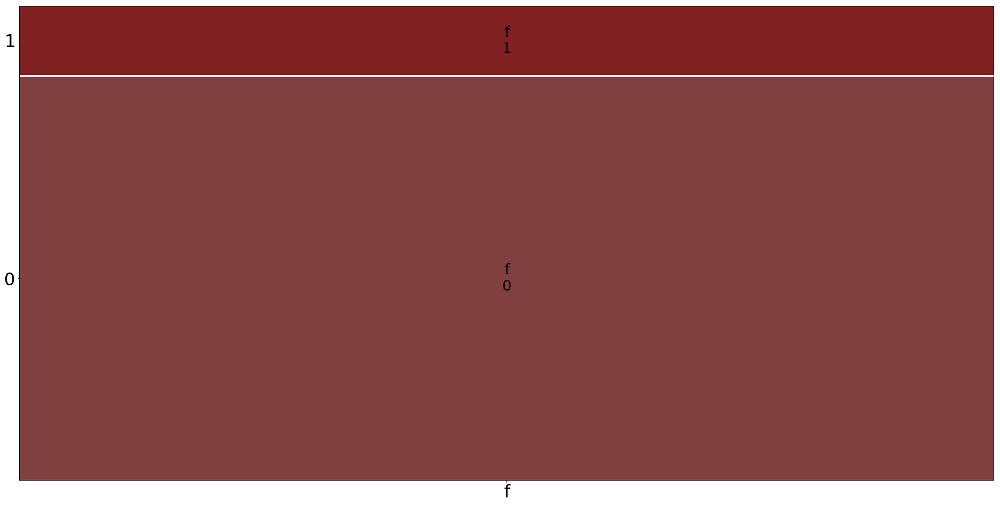

In [35]:
mosaic(data=df, index=['initial_list_status', 'loan_status'])
plt.show()

#Inconclusive as everybody's status is f

Hypothesis:If there is a enough difference between the Line of credit status and the last credit pulled, then may be the default can happen because of it.

earliest_cr_line When the line of credit was opened
last_credit_pull_d When the credit was pulled for the loan.
last_payment_date : What was the last payment date?

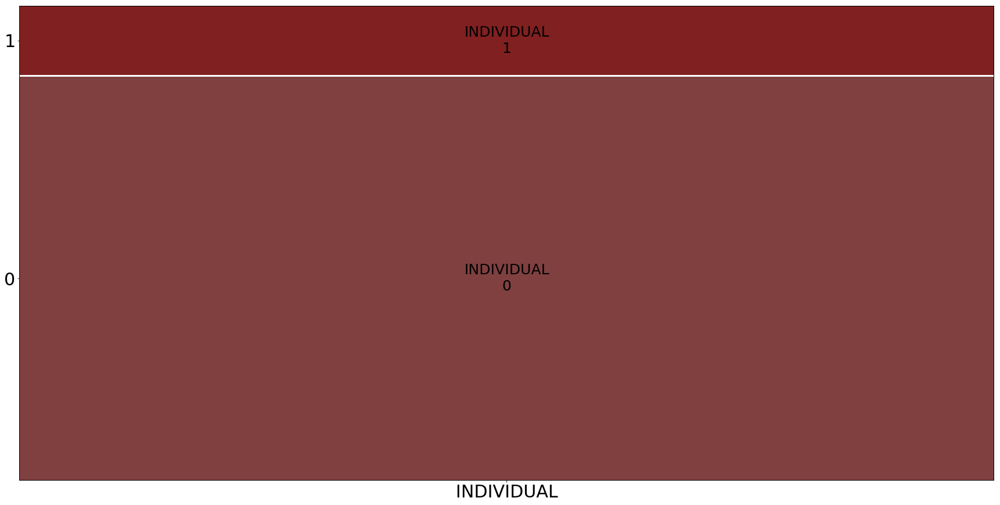

In [36]:
mosaic(data=df, index=['application_type', 'loan_status'])
plt.show()

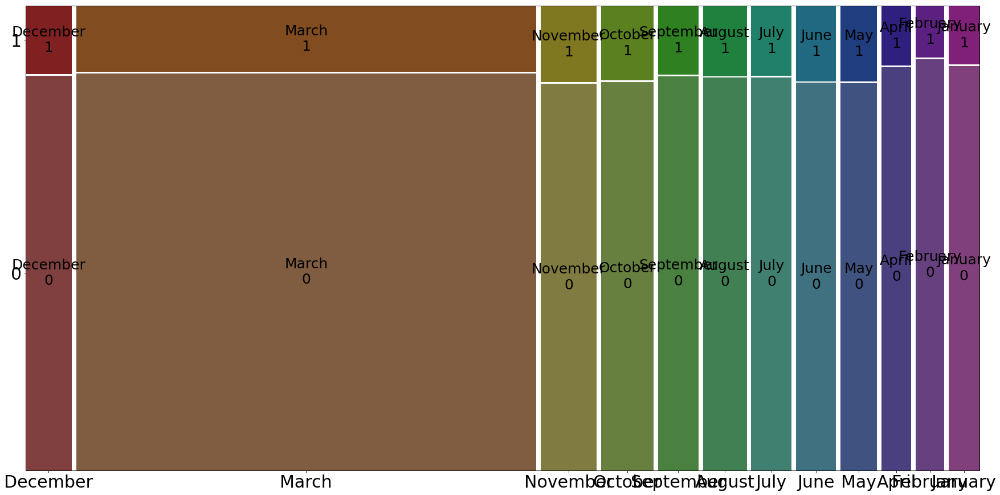

In [37]:
mosaic(data=df, index=['month', 'loan_status'])
plt.show()
#Most loans were given in March
#From Jan -April the loan default status is low as compared to May- December
#Well doesn't conclude much here

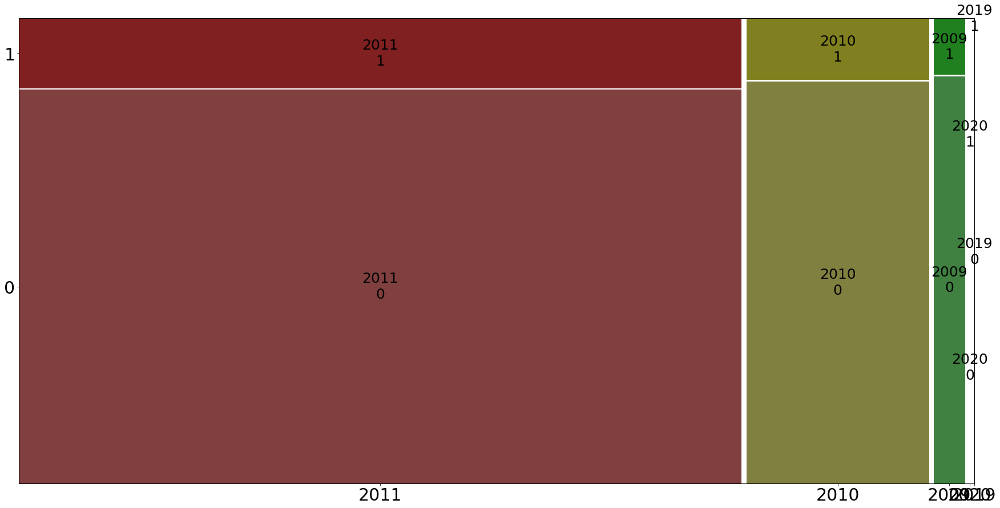

In [38]:
mosaic(data=df, index=['year', 'loan_status'])
plt.show()

#Most loans were given on 2011 and the default rate has an increment 

"Amount Funded By Investors" and "Total Amount Funded", where "Total Amount Funded" is larger.
What is the difference between the two?

I believe that the there is a special group of investors (not LC themselves) that are also invested in the loan, apart from the "regular investors". Thus, the "Total Amount Funded" (and related categories) should be used for any calculations rather than "Amount Funded By Investors".

Note that it appears that LendStats is using  "Amount Funded By Investors" (at least for an individual example that I checked).

https://debanked.com/p2pforum/index.php?topic=254.0

Use loan_amnt and funded_amnt, not funded_amnt_inv.

In [39]:
continious_list

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'term',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'open_acc',
 'revol_bal',
 'revol_util',
 'total_acc',
 'out_prncp_inv',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'last_pymnt_amnt',
 'year']

In [40]:
#Describe the data
df['loan_amnt'].describe()

count    38577.000000
mean     11047.025430
std       7348.441646
min        500.000000
25%       5300.000000
50%       9600.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

In [41]:
'''
This basically means that qcut tries to divide up the underlying data into equal sized bins. 
The function defines the bins using percentiles based on the distribution of the data, 
not the actual numeric edges of the bins.

The major distinction is that qcut will calculate the size of each bin in order to 
make sure the distribution of data in the bins is equal. 
In other words, all bins will have (roughly) the same number of observations but the bin range will vary.

On the other hand, cut is used to specifically define the bin edges. 
There is no guarantee about the distribution of items in each bin.
You can define bins in such a way that no items are included in a bin or nearly all items are in a single bin.

count    38577.000000
mean     11047.025430
std       7348.441646
min        500.000000
25%       5300.000000
50%       9600.000000
75%      15000.000000
max      35000.000000

min-25, 25-50, 50-75, 75-max

The result is a categorical series representing the loan_amt bins.
'''
df['loan_amt_quartile'] = pd.qcut(df['loan_amnt'], q=4)

df['loan_amt_decile'] = pd.qcut(df['loan_amnt'], q=10, precision=0)

df['loan_amt_equalcut'] = pd.cut(df['loan_amnt'], bins=7)

df['loan_amt_quantile_explicit'] = pd.qcut(df['loan_amnt'], q=[0, .2, .4, .6, .8, 1])

pd.crosstab(index=df['loan_amt_quartile'], columns=df['loan_status'])

#pd.crosstab(index=df['loan_amt_decile'], columns=df['loan_status'])

#pd.crosstab(index=df['loan_amt_equalcut'], columns=df['loan_status'])

#pd.crosstab(index=df['loan_amt_quantile_explicit'], columns=df['loan_status'])

#Through this we can conclude that the loan amount increment is exactly boosting the number of defaults
#Also there is not an entire inverse happening at the paid off, it is increasing till the third bracket
#Once the loan amount goes passed 75% of the spread,the amount of paid off is declining and default is increasing.

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/3515737379.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['loan_amt_quartile'] = pd.qcut(df['loan_amnt'], q=4)
/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/3515737379.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['loan_amt_decile'] = pd.qcut(df['loan_amnt'], q=10, precision=0)
/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/3515737379.py:31: SettingWithCopyWarning: 
A value is trying to b

loan_status,0,1
loan_amt_quartile,,
"(499.999, 5300.0]",8322,1342
"(5300.0, 9600.0]",8424,1224
"(9600.0, 15000.0]",9200,1445
"(15000.0, 35000.0]",7004,1616


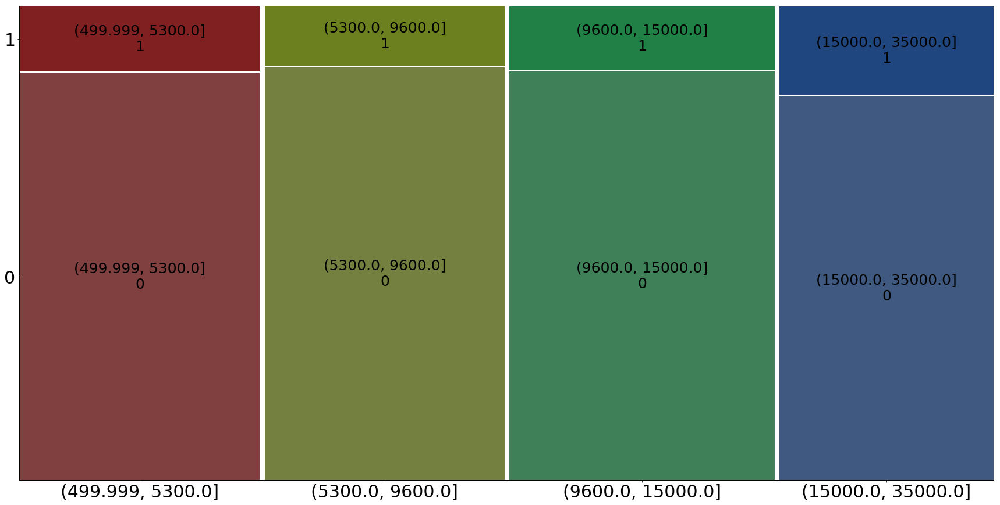

In [42]:
mosaic(data=df, index=['loan_amt_quartile', 'loan_status'])
plt.show()

#Same as above 

In [43]:
#Describe the data
df['term'].describe()

#Not much we can divide here, already two tenures, sort of categories only

count    38577.000000
mean        41.898437
std         10.333136
min         36.000000
25%         36.000000
50%         36.000000
75%         36.000000
max         60.000000
Name: term, dtype: float64

In [44]:
pd.crosstab(index=df['term'], columns=df['loan_status'])

#We can also find out if the term is correlated with loan_status
#because at 36 months the paid off and default rate is higher than 
#the 60 month term.
#Not much people have gone for the 60 month term
#Hence let's move on to a separate presentation

loan_status,0,1
term,,
36,25869,3227
60,7081,2400


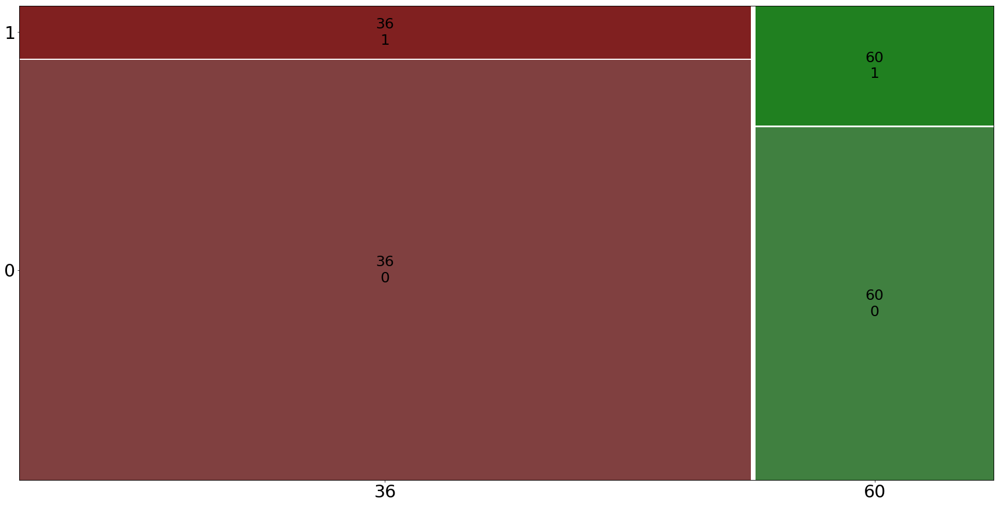

In [45]:
mosaic(data=df, index=['term', 'loan_status'])
plt.show()

#Majority of people have gone for 36 month tenure and have paid off much more and defaulted less
#Otherwise the 60 year term shows the default level increasing and paid off coming down in ratio.
#Higher tenure can give an increase to the default.

In [46]:
#Describe the data
df['int_rate'].describe()

#Here we can divide the interest rate

count    38577.000000
mean        11.932219
std          3.691327
min          5.420000
25%          8.940000
50%         11.710000
75%         14.380000
max         24.400000
Name: int_rate, dtype: float64

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/4037273587.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['int_rate_quartile'] = pd.qcut(df['int_rate'], q=4)


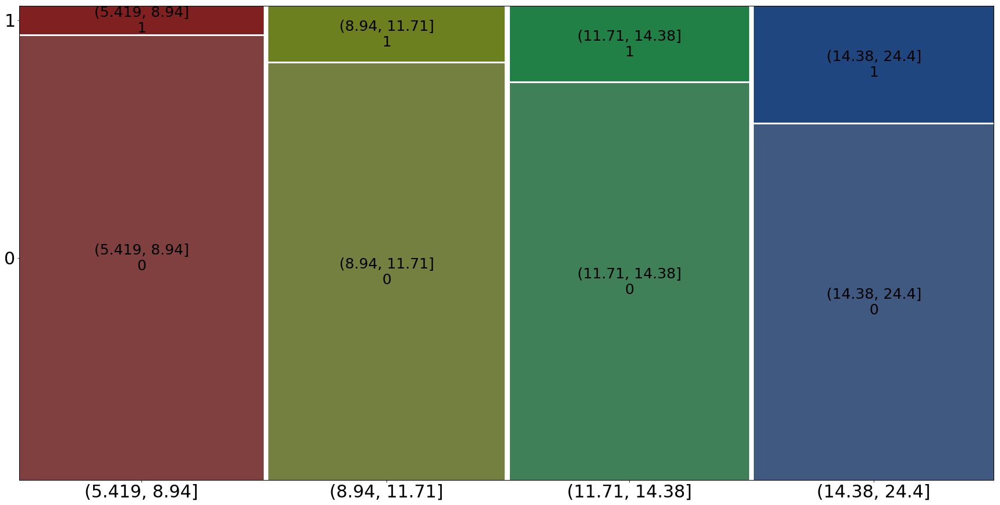

In [47]:
df['int_rate_quartile'] = pd.qcut(df['int_rate'], q=4)
mosaic(data=df, index=['int_rate_quartile', 'loan_status'])
plt.show()

#Frankly the interest rate goes higher, so the defaulting rate.

In [48]:
#Describe the data
df['installment'].describe()

#Well spread out data

count    38577.000000
mean       322.466318
std        208.639215
min         15.690000
25%        165.740000
50%        277.860000
75%        425.550000
max       1305.190000
Name: installment, dtype: float64

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/26640303.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['installment_quartile'] = pd.qcut(df['installment'], q=4)


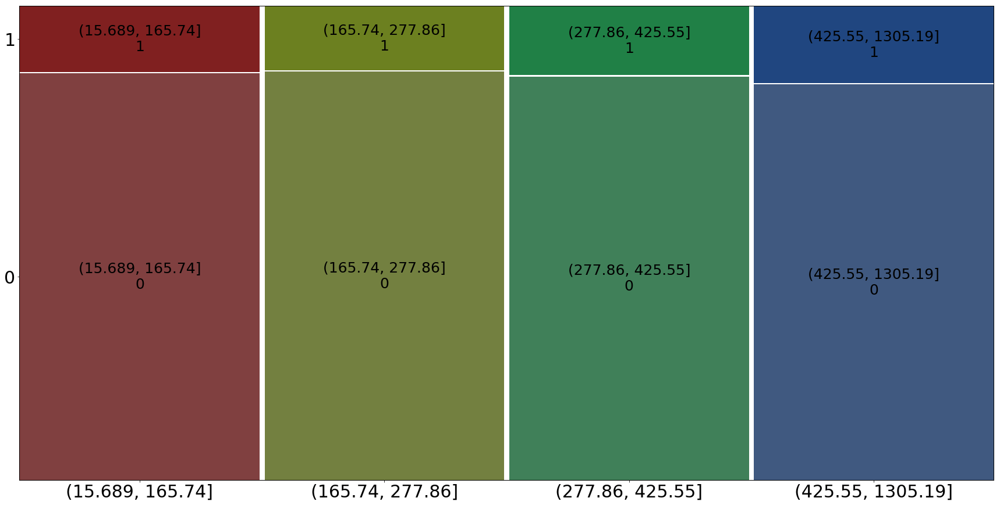

In [49]:
df['installment_quartile'] = pd.qcut(df['installment'], q=4)
mosaic(data=df, index=['installment_quartile', 'loan_status'])
plt.show()

#The population is comparable and the increment in installment can be a driving factor to the default status.
#Although till the 50% of the spread of the installment, the rate of default doesn't make too much difference.
#After 50% of the spread which is somewhere around 250 is incrementing the default rate.
#Installment might be a driving factor

In [50]:
#Describe the data
df['annual_inc'].describe()

#Well spread out data

count     38577.000000
mean      63083.027263
std       28508.832929
min        4000.000000
25%       40000.000000
50%       58868.000000
75%       82000.000000
max      116000.000000
Name: annual_inc, dtype: float64

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/694477073.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['annual_inc_decile'] = pd.qcut(df['annual_inc'], q=10, precision=0)
/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/694477073.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['annual_inc_quartile'] = pd.qcut(df['annual_inc'], q=4)


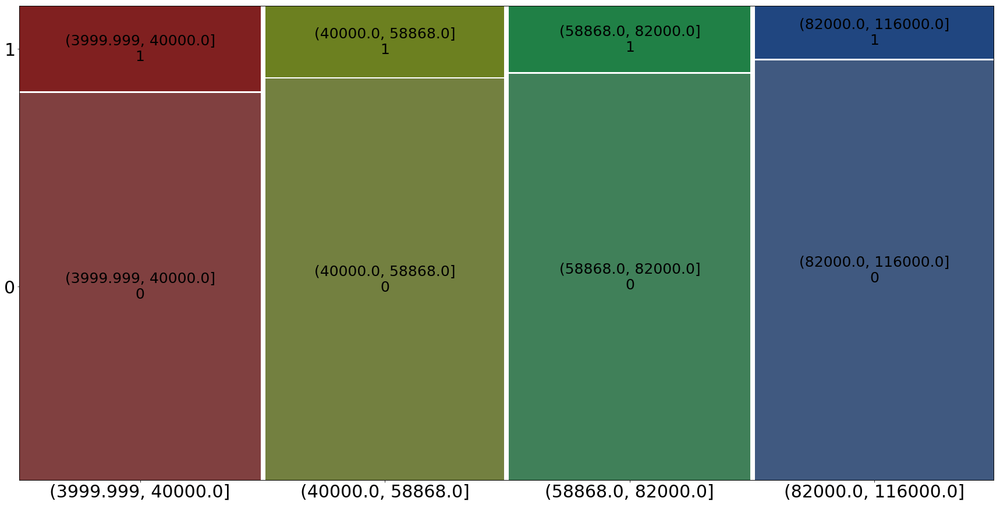

In [51]:
df['annual_inc_decile'] = pd.qcut(df['annual_inc'], q=10, precision=0)

df['annual_inc_quartile'] = pd.qcut(df['annual_inc'], q=4)

#pd.crosstab(index=df['annual_inc_decile'], columns=df['loan_status'])

mosaic(data=df, index=['annual_inc_quartile', 'loan_status'])
plt.show()

#Higher the income lower the default rate over proportional distribution.

In [52]:
#Describe the data
df['dti'].describe()

#Well spread out data

count    38577.000000
mean        13.272727
std          6.673044
min          0.000000
25%          8.130000
50%         13.370000
75%         18.560000
max         29.990000
Name: dti, dtype: float64

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/830695263.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['dti_quartile'] = pd.qcut(df['dti'], q=4)


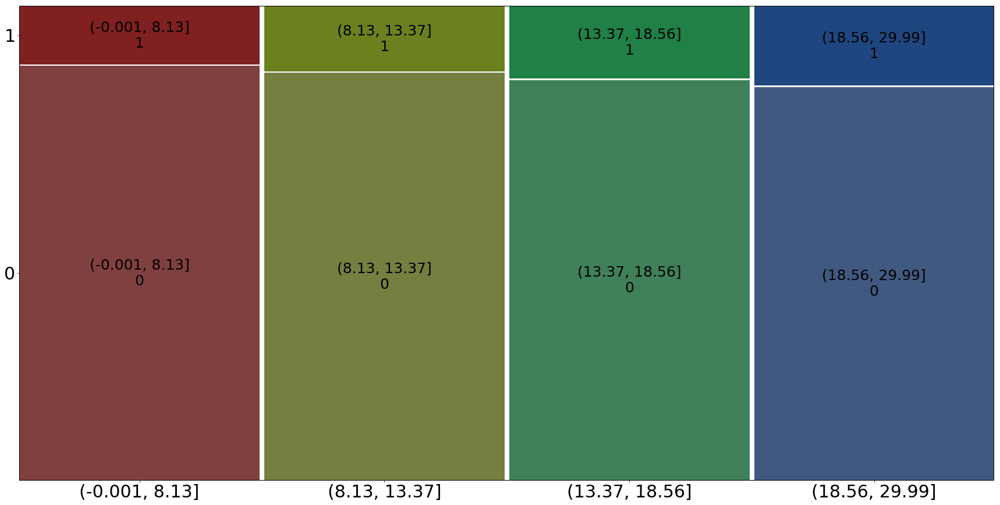

In [53]:
df['dti_quartile'] = pd.qcut(df['dti'], q=4)

mosaic(data=df, index=['dti_quartile', 'loan_status'])
plt.show()

#The more positive output, the bigger the debt over the income, the more the debt over income increases,
#it will result in default.

In [54]:
#Describe the data
df['delinq_2yrs'].describe()

#Not a spread out data 

count    38577.000000
mean         0.108640
std          0.311191
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: delinq_2yrs, dtype: float64

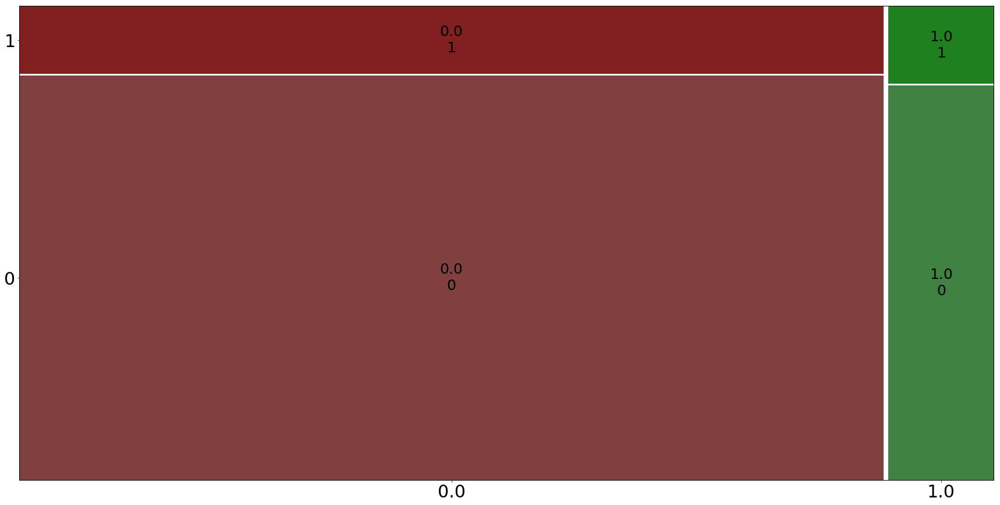

In [55]:
mosaic(data=df, index=['delinq_2yrs', 'loan_status'])
plt.show()

#Those who have deliquency of atleast 1 30+ days in the past 2 years are going to default more.
#delinq_2yrs can be a driving metric before handing out loan

Impact of an inquiry on your credit score?

A soft inquiry is an inquiry that isn’t registered on your credit report. Soft inquiries are typically run by lenders on existing customers to see if you qualify for certain credit products or offers. For instance, your bank might perform a “soft pull” to see if your credit limit can be increased or if you qualify for select offers based on your current credit standing. Soft inquiries aren’t detrimental to your credit health and applying for new credit won’t allow lenders to know of any soft pulls that might have taken place in the past.

A hard inquiry, on the other hand, gets registered on your credit report. Lenders go-in for a “Hard Pull” when they want to evaluate your credit report to make a subsequent lending decision. Hard pulls occur when you send in your application for personal loans, credit cards, home loans, car loans or property loans – literally every legit form of credit you apply for. That said, stray instances of hard pulls won’t essentially bring down your credit score by a massive margin – meaning that if you wish to apply for a new credit card whilst already holding 2-3 cards, an ensuing hard pull is unlikely to adversely impact your credit score to turn a lending decision against you. Hard inquiries, unlike soft inquiries, can be viewed by you in your credit report and don’t disappear with time.

In [56]:
#Describe the data
df['inq_last_6mths'].describe()

#Not a spread out data 

count    38577.000000
mean         0.871737
std          1.071546
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          8.000000
Name: inq_last_6mths, dtype: float64

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/3104183522.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['inq_last_6mths_slices'] = pd.cut(df['inq_last_6mths'], bins=cut_bins)


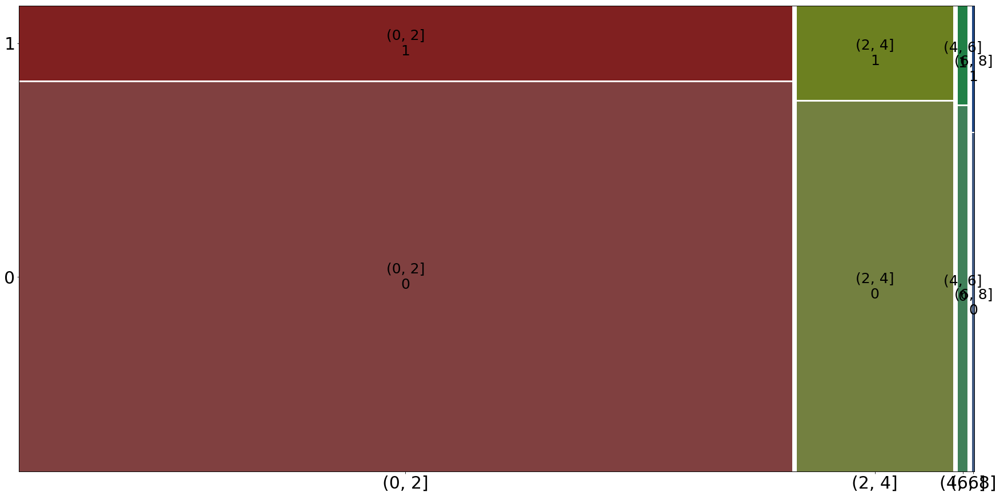

In [57]:
cut_bins = [0, 2, 4,6, 8]
df['inq_last_6mths_slices'] = pd.cut(df['inq_last_6mths'], bins=cut_bins)

mosaic(data=df, index=['inq_last_6mths_slices', 'loan_status'])
plt.show()

#Although from 0 to 2 bin inquiries, the 2 to 3 the default rate increases, but after that the 
#default rate rises, if we cut the bin into diff of 2, then it's a dipping default rate.

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/1141592631.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['inq_last_6mths_slices'] = pd.cut(df['inq_last_6mths'], bins=cut_bins)


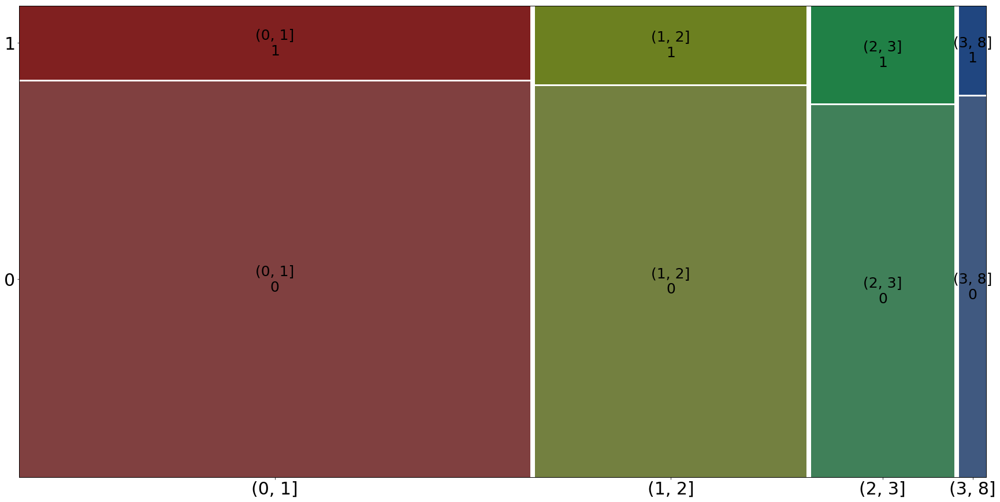

In [58]:
cut_bins = [0, 1, 2, 3, 8]
df['inq_last_6mths_slices'] = pd.cut(df['inq_last_6mths'], bins=cut_bins)

mosaic(data=df, index=['inq_last_6mths_slices', 'loan_status'])
plt.show()

#For max population the number of inquiries is affecting the default rate.
#Although there has been an minor increase in default after 3 inquiries from a small population.

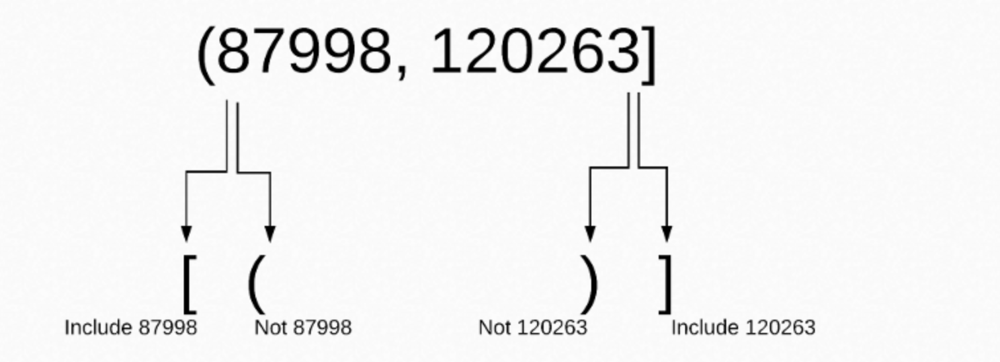

In [59]:
#Describe the data
df['open_acc'].describe()

#A spread out data 

df['open_acc'] = df['open_acc'].astype('int')

df['open_acc']

df['open_acc'].describe()

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/1193565798.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['open_acc'] = df['open_acc'].astype('int')


count    38577.000000
mean         9.275423
std          4.401588
min          2.000000
25%          6.000000
50%          9.000000
75%         12.000000
max         44.000000
Name: open_acc, dtype: float64

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/3127162290.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['open_acc_quartile'] = pd.qcut(df['open_acc'], q=4)


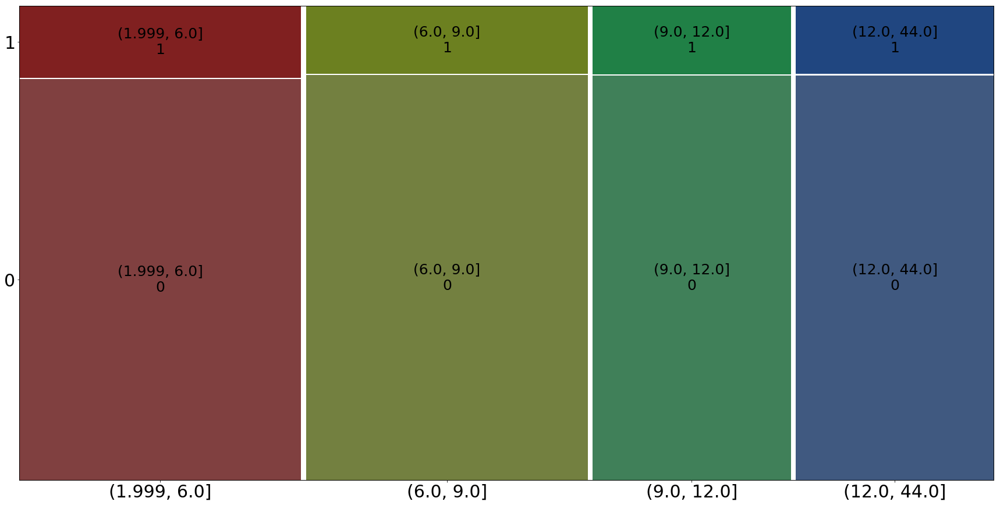

In [60]:
#Whenever cutting the data with quantile, qcut, make sure we concentrate on the 25-50 and 50-75 coz they make
#the 50% of the population.
#Convert the data type

df['open_acc_quartile'] = pd.qcut(df['open_acc'], q=4)

#pd.crosstab(index=df['annual_inc_decile'], columns=df['loan_status'])

mosaic(data=df, index=['open_acc_quartile', 'loan_status'])
plt.show()

#The number of line of credit over the population do not make such difference in the default rate.
#Even the last 25% of the population is not making such difference over the default rate.

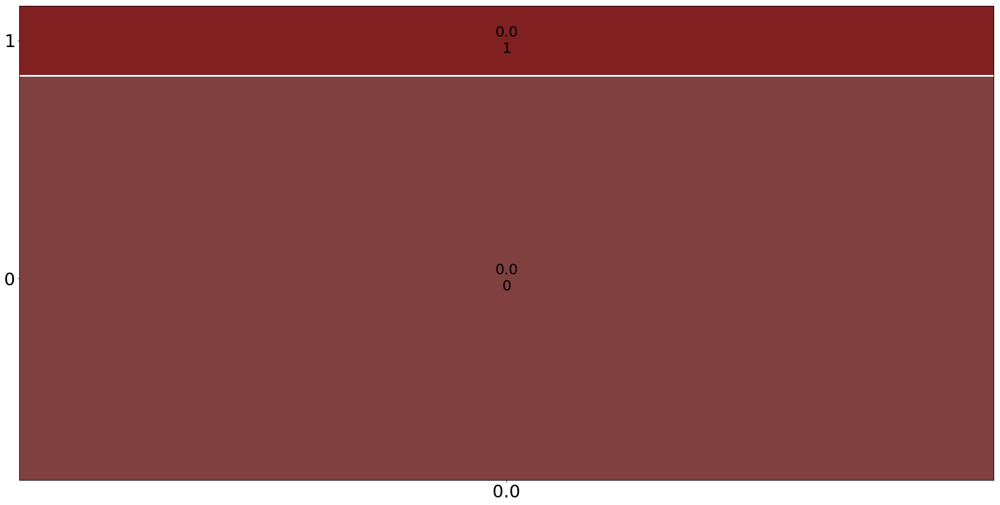

In [61]:
#Describe the data
df['pub_rec'].describe()

#There isn't much to do here

mosaic(data=df, index=['pub_rec', 'loan_status'])
plt.show()

What is revol_bal?

Revolving Balance- If you don't pay the balance on your revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance. You might apply for credit assuming you'll always pay your balance in full every month.

In [62]:
#Describe the data
df['revol_bal'].describe()

#Spread out data 

count    38577.00000
mean     11203.14801
std       9132.38781
min          0.00000
25%       3650.00000
50%       8762.00000
75%      16912.00000
max      29144.40000
Name: revol_bal, dtype: float64

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/1250465465.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['revol_bal_quartile'] = pd.qcut(df['revol_bal'], q=4)


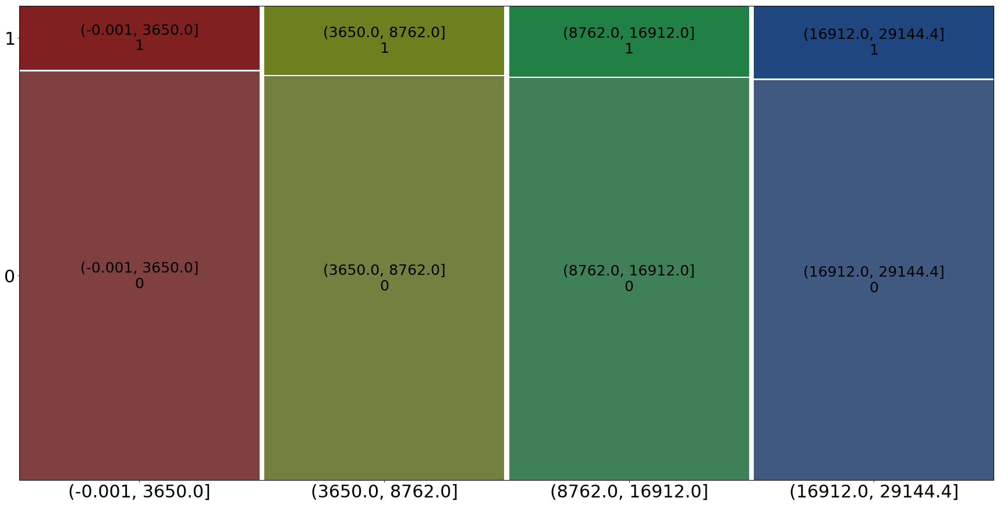

In [63]:
df['revol_bal_quartile'] = pd.qcut(df['revol_bal'], q=4)

mosaic(data=df, index=['revol_bal_quartile', 'loan_status'])
plt.show()

#A slight drift in the default rate as the revolving balance increases, not much to take a hit on the default rate

Revolving utilization is the proportion of your credit card balance to your credit card limit. It is also called your debt-to-limit ratio or your credit utilization ratio.

The consensus is you should keep your credit utilization ratio at no more than 30%. Keeping your credit utilization even lower is better. Lenders view people who charge too much on their cards, especially if the cards are maxed out, as a higher credit risk. As a result, having a higher credit card utilization will lower your credit score.

Here is a look at what credit utilization percentage could mean for you:

75% or more: Borrowers in this range are considered to be the highest risk
50% to 75%: This credit utilization looks very risky
Under 50%: Getting your utilization under 50% should be your first goal so that you look less risky to a lender
1% to 5%: Your personal credit score will receive the most points at this credit utilization

In [64]:
#Describe the data
df['revol_util'].describe()

#Excellent spread

count    38577.000000
mean        48.703551
std         28.346361
min          0.000000
25%         25.200000
50%         49.100000
75%         72.200000
max         99.900000
Name: revol_util, dtype: float64

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/3547279119.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['revol_util_quartile'] = pd.qcut(df['revol_util'], q=4)


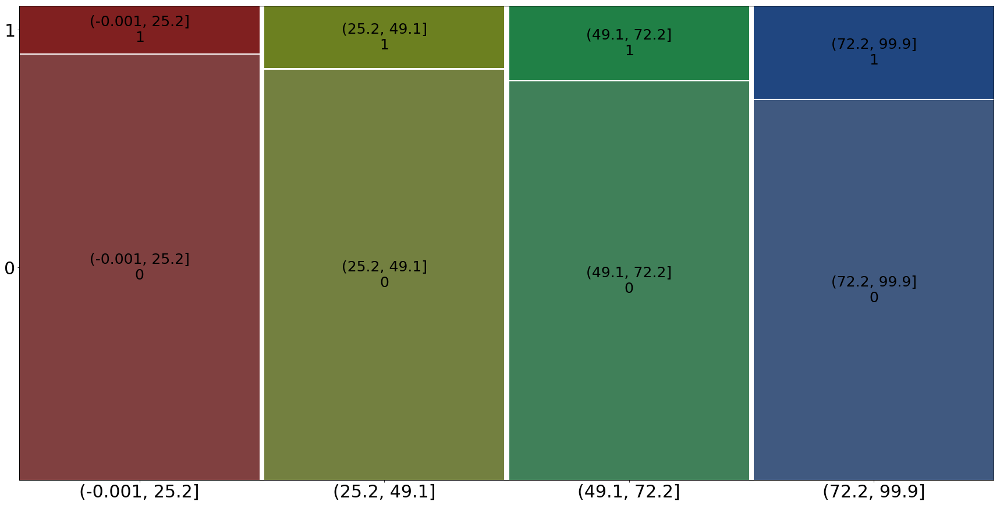

In [65]:
df['revol_util_quartile'] = pd.qcut(df['revol_util'], q=4)

mosaic(data=df, index=['revol_util_quartile', 'loan_status'])
plt.show()

#The info seems correct your revolving utilization increases, so is your chances of def.
#Driving factor pretty simlar to DTI

In [66]:
#Describe the data
df['total_acc'].describe()

#Excellent spread

count    38577.000000
mean        22.052648
std         11.425861
min          2.000000
25%         13.000000
50%         20.000000
75%         29.000000
max         90.000000
Name: total_acc, dtype: float64

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/225237115.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['total_acc_quartile'] = pd.qcut(df['total_acc'], q=4)


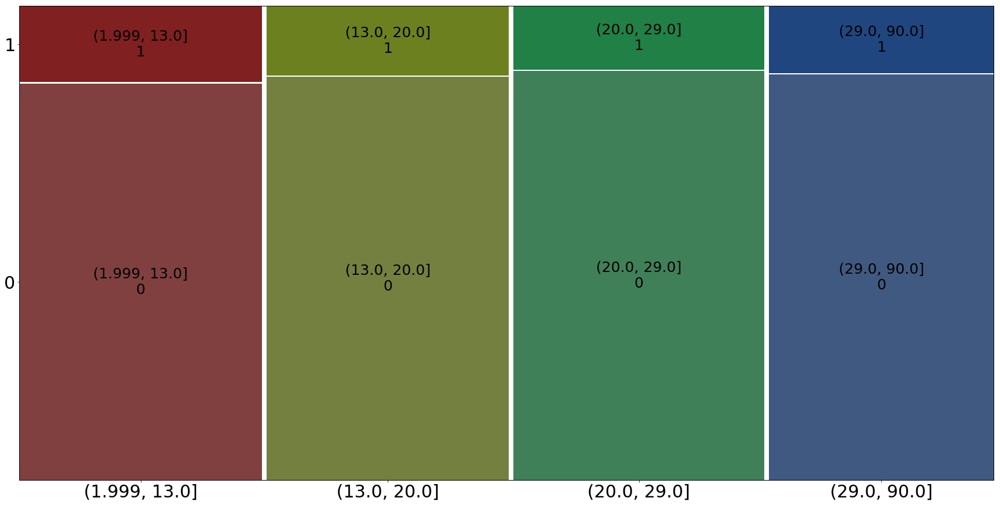

In [67]:
df['total_acc_quartile'] = pd.qcut(df['total_acc'], q=4)

mosaic(data=df, index=['total_acc_quartile', 'loan_status'])
plt.show()

#Not very conclusive as the number of credit lines do not actually talks much about the default rate.

In [68]:
#Parameter which shows how much principal amount is left and how it affects the loan_status
#Describe the data
df['out_prncp'].describe()

#Oops the data is all zeroes, hence not much to do with it.

count    38577.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: out_prncp, dtype: float64

In [69]:
#Total payment to be done, is as same as the interest for the loan + loan amount, hence we can map it against loanstat
df['total_pymnt'].describe()

count    38577.000000
mean     11866.970365
std       8809.856227
min          0.000000
25%       5513.497338
50%       9674.048405
75%      16136.952430
max      58563.679930
Name: total_pymnt, dtype: float64

/var/folders/jh/7_fy1z7j7bd3_v183l3hv1h00000gp/T/ipykernel_30502/1259943442.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['total_pymnt_quartile'] = pd.qcut(df['total_pymnt'], q=4)


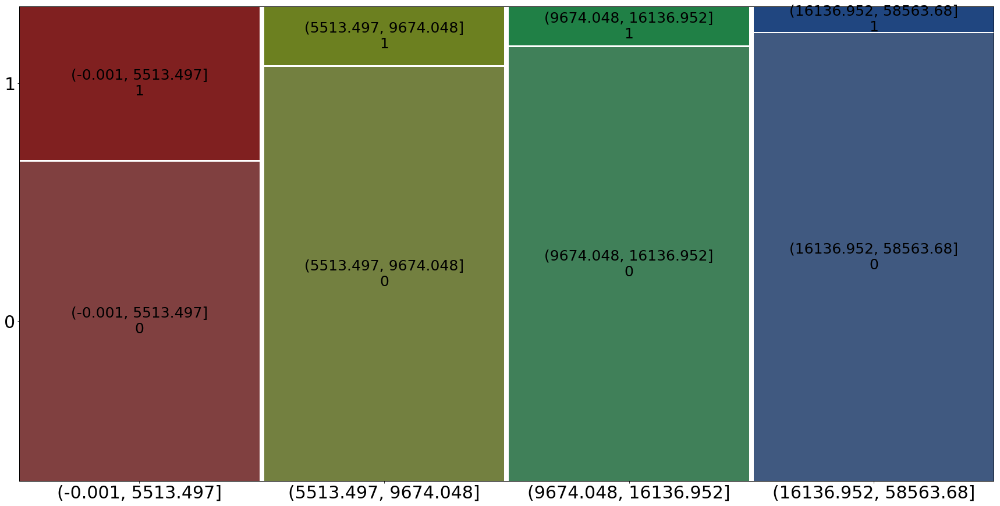

In [70]:
df['total_pymnt_quartile'] = pd.qcut(df['total_pymnt'], q=4)

mosaic(data=df, index=['total_pymnt_quartile', 'loan_status'])
plt.show()

#So over an isometric distribution, the exceeding total payment is actually reducing the default rate
#The defaulting mostly exists for smaller loans. Total payment is a driving factor.

In [71]:
df['recoveries'].describe()

#No spread, no use to the default rate as the loan is already defaulted.

count    38577.00000
mean         1.47166
std          4.20583
min          0.00000
25%          0.00000
50%          0.00000
75%          0.00000
max         13.59800
Name: recoveries, dtype: float64

In [72]:
df['chargeoff_within_12_mths'].describe()

count    38577.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: chargeoff_within_12_mths, dtype: float64

In [73]:
df['year'].describe()

count    38577.000000
mean      2010.738704
std          0.516328
min       2009.000000
25%       2011.000000
50%       2011.000000
75%       2011.000000
max       2020.000000
Name: year, dtype: float64

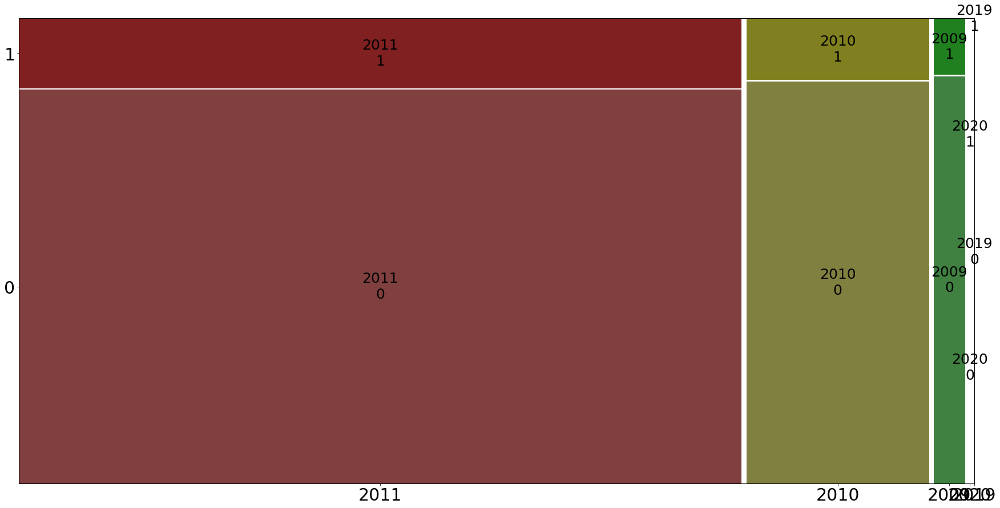

In [74]:
mosaic(data=df, index=['year', 'loan_status'])
plt.show()

#Most loans were passed by 2010 and 2011 and the default rate has shifted from 2009 to 2011, observation

# #Bivariate analysis which continues correlation

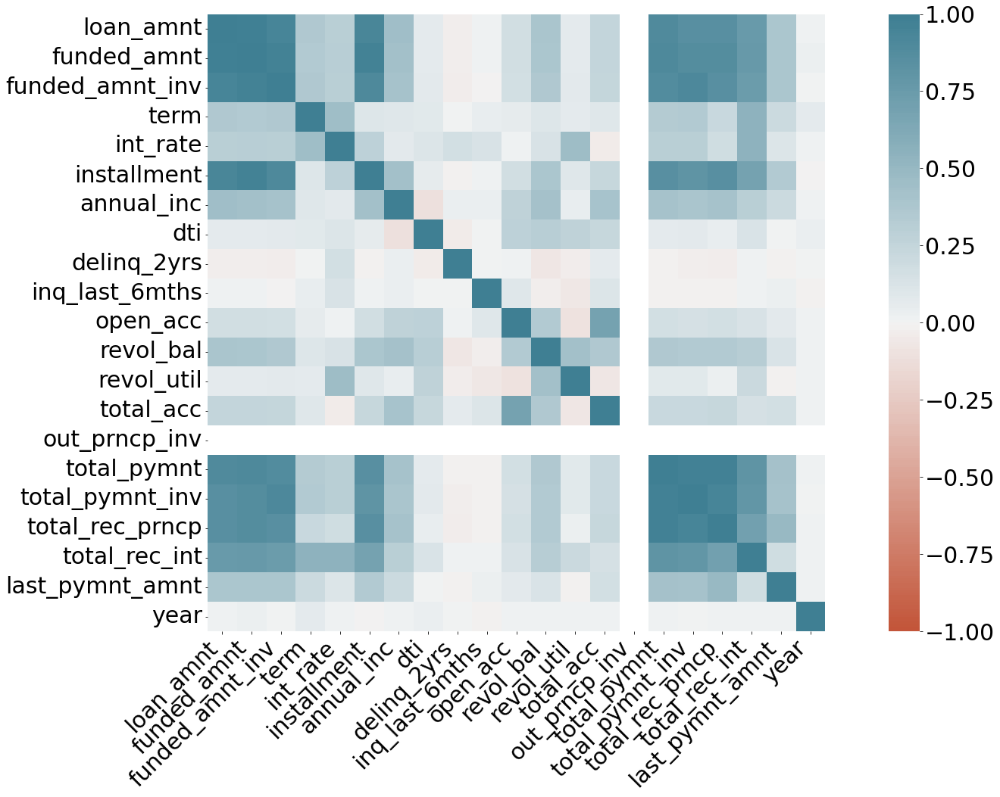

In [75]:
#The heatmap can be done between two continuous variables only, not through categorical

correlation_data = loan_csv_mod[continious_list]

correlation_data.head()

corr = correlation_data.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

* Installment is highly correlated with the funded amount .
* open_acc is correlated to the total_access, both sort of explains the line of credit

### Bivariate analyses are conducted to determine whether a statistical association exists between two variables, the degree of association if one does exist, and whether one variable may be predicted from another. 

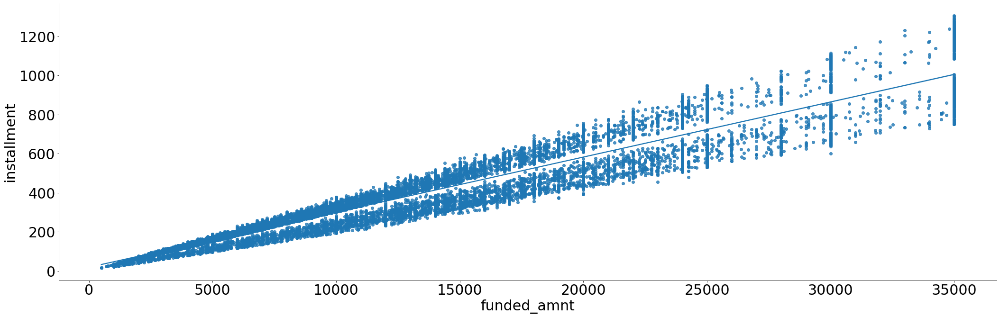

In [76]:
#df.plot.scatter(x = 'funded_amnt', y = 'installment')
sns.lmplot(x='funded_amnt', y='installment', data=df, height=10, aspect=3)

#Although there are outliers present, there is a bit of trend line which justifies the correlation we see above

A scatter plot can't be done between a categorical and a contnuous variable.
Hence we try a pivot table and layering with grade and subgrade.

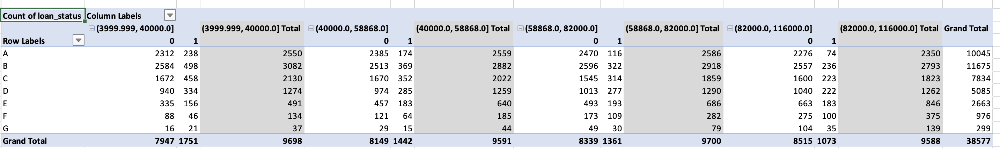

From grade A to G, people with increasing income may or may not defaulting less/more.
In this situation we need a ratio.

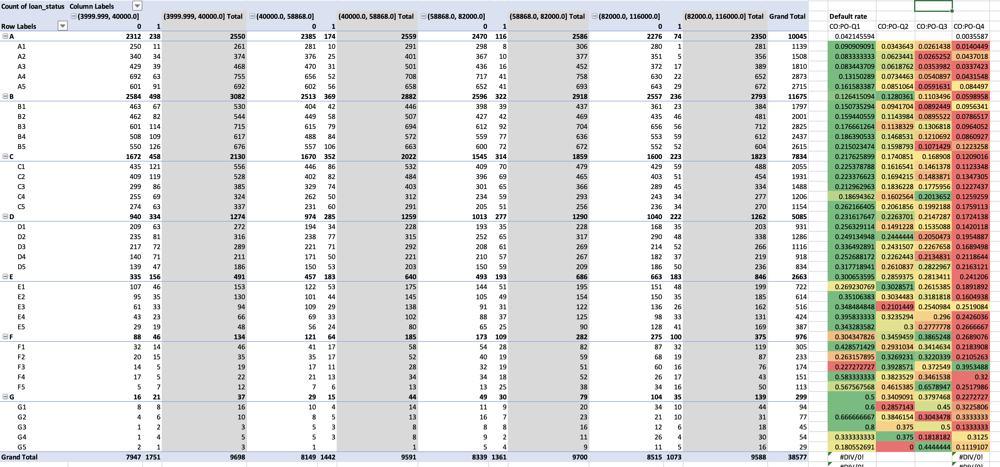

As we can see throughout the highlighted (left to right), with the increasing income of the top grades (A to D)
the default rate is decreasing.
Hence we can give the loans based on the grades and income.

In [77]:
#pd.pivot_table(df, index='grade', columns='annual_inc_quartile', values='loan_status', aggfunc=('count'), margins=True)

In [78]:
#Addition of the the business driven metric that is the credit score:
def grade_score(grade_given):
  if grade_given == 'A':
    return 9
  elif grade_given== 'B':
    return 7
  elif grade_given== 'C':
    return 5
  elif grade_given== 'D':
    return 3
  elif grade_given== 'E':
    return 2
  elif grade_given== 'F':
    return 1
  else:
    return 0

#Derived from the purpose
#major purpose, credit_card, car wedding and home_imprvement
def purpose_score(given_verification):
  if given_verification == "major purpose" or given_verification == "credit_card" or given_verification == "car" or given_verification == "home_improvement" or given_verification == "wedding":
    return 8
  else:
    return 4


def cibil_score(x):
    x['credit_score'] = ((x['dti']/43 + grade_score(x['grade'])*30) + ((10 - x['inq_last_6mths'])*10) - (x['total_rec_late_fee']*35) + (purpose_score(x['purpose'])*25))
    return x

df = df.apply(lambda x: cibil_score(x), axis=1)
df['credit_score'].describe()

#Quite a good spread we have, min score is 150 and max can go close to 600

count    38577.000000
mean       399.445978
std         91.083030
min        150.193023
25%        340.198140
50%        410.102326
75%        470.127442
max        570.696047
Name: credit_score, dtype: float64

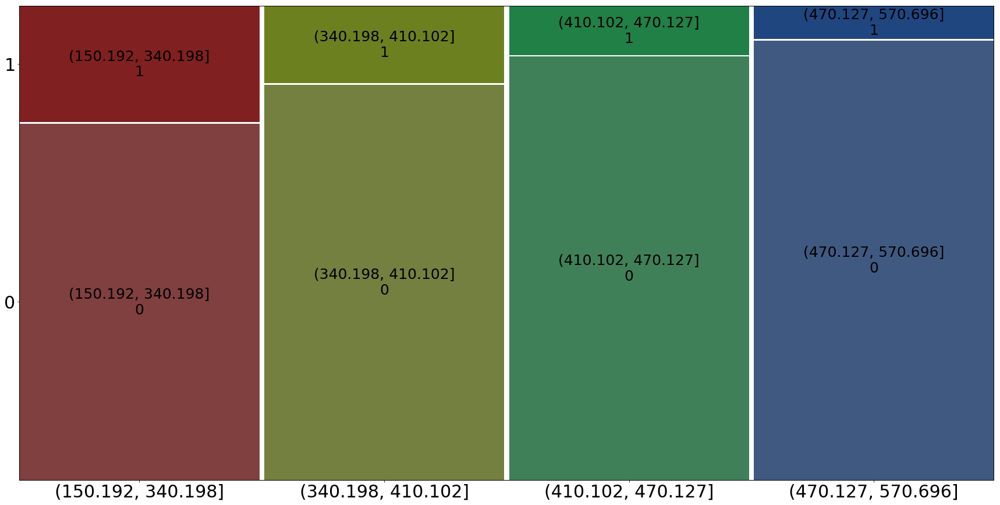

In [79]:
df['credit_score_quartile'] = pd.qcut(df['credit_score'], q=4)

mosaic(data=df, index=['credit_score_quartile', 'loan_status'])
plt.show()

#As we can see that the derived credit score as high, the default rate comes down
#We can say anything more than 450 is a good score.

In [80]:
df.to_csv('Lender_case_study/df_derived.csv')

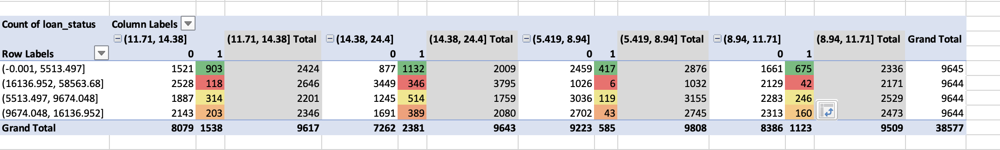


As we can see, the maximum default for the total amount bracket is lower at any interest rate.
The least risk of defaulting at any rate of interest bracket for the second bracket total amount.
* The most default is for lowest bracket of total amount payable with the highest rate of interest.
* The least default is for the second bracket of total amount payable at the least rate of interest.

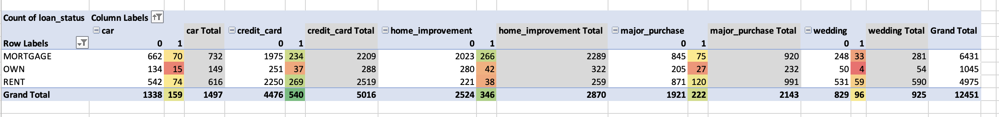

House ownership and purpose impacting the loan status.

* So we can see the OWN category has a better performance on all the best bets we had from the purpose which determines the loan_status. Lowest number of defaults in best purpose. 

* The highest number of defaults with Rent and Credit card in the best bets.

* Small business which was driving the default rate, RENT + Small Business purpose loan has high default rate.

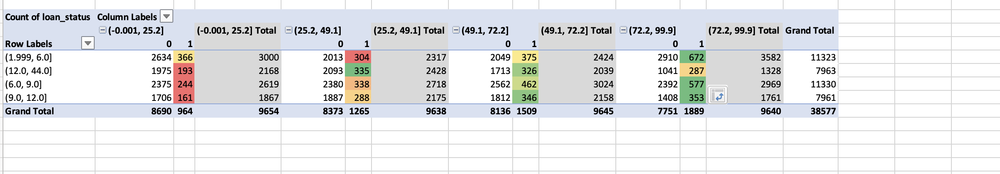

With open accesses available and with revolving utilization impacting the loan_status.
* Withe the smallest bracket of line of access , and highest revolving utilization, the number of default increases.

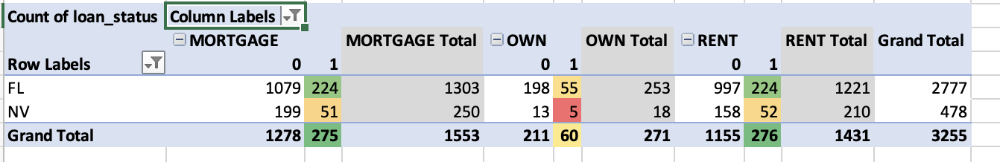

Two of the poor perfoming states (NV and FL) in the default rate, those with mortgage or rent are defaulting in the
Loan_status

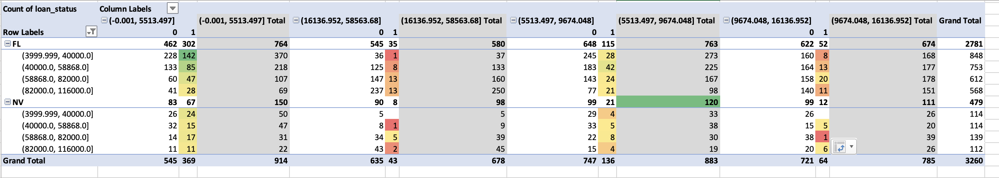

Analysis of two most defaulting states with salary divisions when mapped against the total loan payment bracket to check the loan status.

* We can see the people with least income and least loan payment amount are defaulting the most in these two states.

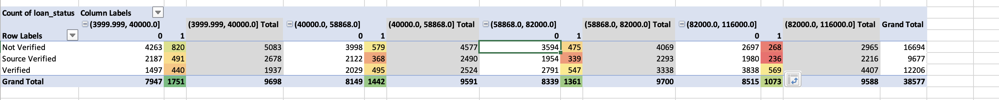

Verification status when mapped against the income brackets affect on the loan_status.
* The most default rate increased for unverified loans to the least income grade population.
* For verified status, which we saw the default rate was increasing, now the default rate gets boosted while the 
* income bracket goes higher.

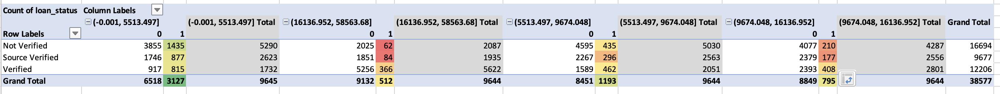

Verification status when mapped with total loan payment leading to the loan status.
* The unverified small bracket loans are the ones to be most defaulted.